## Imports and Setup

In [30]:
!pip install textblob

import pandas as pd
import numpy as np
import sklearn
import requests
import matplotlib.pyplot as plt  # Ensure plt is imported
import matplotlib.dates as dates
import seaborn as sns
import textblob
#from wordcloud import WordCloud
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

import pickle
import re
import time
import datetime                              # access to %%time, for timing individual notebook cells
import os
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

%matplotlib inline
%config InlineBackend.figure_format='retina'

# Use 'seaborn-v0_8' instead of 'seaborn'
plt.style.use('seaborn-v0_8')  # This line is changed to use a valid seaborn style
plt.rcParams["figure.figsize"] = (15,10)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:
import pandas as pd

# Define file path
file_path = "/content/drive/MyDrive/ITS RESEARCH/2025/2025 Pemprov Jatim Survey ASN checker/28AGT2025/28AUG_final_clean.xlsx"

# Read the Excel file
df_review_asn = pd.read_excel(file_path)

# Display the first few rows
df_review_asn.head()


,nama,usia,jenis_kelamin,email,NIP,pd_uobk,instansi,uobk,unit_kerja,jabatan_fungsional,...,Berorientasi Pelayanan,Akuntabel,Kompeten,Harmonis,Loyal,Adaptif,Kolaboratif,Tidak Ada,Dengan alasan...,_index
0,"AIRIN NURNANINGSIH, SE",40,Perempuan,airinnurnaningsih05@gmail.,198504062015022016,Perangkat Daerah,BADAN KOORDINASI WILAYAH MALANG,NaN,NaN,Jabatan Fungsional,...,0,0,0,1,0,1,0,0,"level eselon sering terjadi miskomunikasi,, belum bisa menerima perubahan-perubahan baru",9
1,Sefrinda Gunawan,32,Perempuan,gsefrinda@gmail.com,199309202020121984,Perangkat Daerah,"DINAS PEMBERDAYAAN PEREMPUAN, PERLINDUNGAN ANAK DAN KEPENDUDUKAN",NaN,NaN,Jabatan Fungsional,...,0,0,0,1,0,0,0,0,Seringkali saran dan kritik diberikan dengan kalimat kurang sopan oleh beberapa oknum,10
2,Arum Putri Iswanti,31,Perempuan,arum.putri36@gmail.com,199308222023212000,Perangkat Daerah,"DINAS PEMBERDAYAAN PEREMPUAN, PERLINDUNGAN ANAK DAN KEPENDUDUKAN",NaN,NaN,PPPK,...,0,0,0,0,0,0,0,1,"Semua komponen berahlak bisa dilaksanakan dengan mudah, hanya jika kita menjadi pribadi yang profesional dalam bekerja",11
3,ABDUL HABIB,49,Laki-laki,abdulhabib46717@gmail.com,197605151997031008,UOBK,NaN,RS JIWA MENUR,NaN,Administrator,...,0,0,0,1,0,0,0,0,masih ada ego tersendiri,12
4,Atip Rofi'a,41,Perempuan,atip.rafifi@gmail.com,198310222010012000,UOBK,NaN,RS JIWA MENUR,NaN,Jabatan Fungsional,...,0,0,0,0,0,0,0,1,Berakhlak mudah diterapkan ditugas sehari hari,13


In [14]:
df_review_asn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16636 entries, 0 to 16635
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   nama                    16636 non-null  object
 1   usia                    16636 non-null  int64 
 2   jenis_kelamin           16636 non-null  object
 3   email                   16636 non-null  object
 4   NIP                     16636 non-null  object
 5   pd_uobk                 16636 non-null  object
 6   instansi                10438 non-null  object
 7   uobk                    6198 non-null   object
 8   unit_kerja              688 non-null    object
 9   jabatan_fungsional      16599 non-null  object
 10  sulit_diterapkan        16636 non-null  object
 11  Berorientasi Pelayanan  16636 non-null  int64 
 12  Akuntabel               16636 non-null  int64 
 13  Kompeten                16636 non-null  int64 
 14  Harmonis                16636 non-null  int64 
 15  Lo

In [16]:
# Group the dataframe by the 'Perangkat Daerah/UOBK?' column
grouped = df_review_asn.groupby('pd_uobk')

# Create two dataframes based on the grouping
df_perangkat_daerah = grouped.get_group('Perangkat Daerah')
df_uobk = grouped.get_group('UOBK')

# Display the first few rows of each new dataframe to confirm
print("First 5 rows of df_perangkat_daerah:")
display(df_perangkat_daerah.head())

print("\nFirst 5 rows of df_uobk:")
display(df_uobk.head())

First 5 rows of df_perangkat_daerah:


,nama,usia,jenis_kelamin,email,NIP,pd_uobk,instansi,uobk,unit_kerja,jabatan_fungsional,...,Berorientasi Pelayanan,Akuntabel,Kompeten,Harmonis,Loyal,Adaptif,Kolaboratif,Tidak Ada,Dengan alasan...,_index
0,"AIRIN NURNANINGSIH, SE",40,Perempuan,airinnurnaningsih05@gmail.,198504062015022016,Perangkat Daerah,BADAN KOORDINASI WILAYAH MALANG,NaN,NaN,Jabatan Fungsional,...,0,0,0,1,0,1,0,0,"level eselon sering terjadi miskomunikasi,, belum bisa menerima perubahan-perubahan baru",9
1,Sefrinda Gunawan,32,Perempuan,gsefrinda@gmail.com,199309202020121984,Perangkat Daerah,"DINAS PEMBERDAYAAN PEREMPUAN, PERLINDUNGAN ANAK DAN KEPENDUDUKAN",NaN,NaN,Jabatan Fungsional,...,0,0,0,1,0,0,0,0,Seringkali saran dan kritik diberikan dengan kalimat kurang sopan oleh beberapa oknum,10
2,Arum Putri Iswanti,31,Perempuan,arum.putri36@gmail.com,199308222023212000,Perangkat Daerah,"DINAS PEMBERDAYAAN PEREMPUAN, PERLINDUNGAN ANAK DAN KEPENDUDUKAN",NaN,NaN,PPPK,...,0,0,0,0,0,0,0,1,"Semua komponen berahlak bisa dilaksanakan dengan mudah, hanya jika kita menjadi pribadi yang profesional dalam bekerja",11
23,FENI PUJI UTAMI,39,Perempuan,feniutty@gmail.com,198601292005012000,Perangkat Daerah,BIRO PEREKONOMIAN,NaN,NaN,Jabatan Fungsional,...,0,0,0,0,0,0,0,1,semua komponen telah diterapkan dalam Perangkat Daerah,38
24,I Made Ngurah Iswara Mahaputra Sriada SA,30,Laki-laki,tuperekonomian3@gmail.com,199506092022040992,Perangkat Daerah,BIRO PEREKONOMIAN,NaN,NaN,Pelaksana,...,0,0,0,0,0,0,0,1,Pemahaman sebuah instansi khususnya terkait capaian kinerja dan penganggaran membutuhkan pemahaman secara mendalam dan komprehensif terkait isu dan permasalahan strategis yang dihadapi oleh sebuah...,39



First 5 rows of df_uobk:


,nama,usia,jenis_kelamin,email,NIP,pd_uobk,instansi,uobk,unit_kerja,jabatan_fungsional,...,Berorientasi Pelayanan,Akuntabel,Kompeten,Harmonis,Loyal,Adaptif,Kolaboratif,Tidak Ada,Dengan alasan...,_index
3,ABDUL HABIB,49,Laki-laki,abdulhabib46717@gmail.com,197605151997031008,UOBK,NaN,RS JIWA MENUR,NaN,Administrator,...,0,0,0,1,0,0,0,0,masih ada ego tersendiri,12
4,Atip Rofi'a,41,Perempuan,atip.rafifi@gmail.com,198310222010012000,UOBK,NaN,RS JIWA MENUR,NaN,Jabatan Fungsional,...,0,0,0,0,0,0,0,1,Berakhlak mudah diterapkan ditugas sehari hari,13
5,"Astri Suryaningsih, S.IIP",33,Perempuan,astrisuryaningsih.surabaya@gmail.com,199203082020121984,UOBK,NaN,RS JIWA MENUR,NaN,Jabatan Fungsional,...,0,0,0,1,0,0,0,0,Masih ada orang egois,14
6,Moch Aminullah,39,Laki-laki,aminem2811@gmail.com,198604102024211008,UOBK,NaN,RS JIWA MENUR,NaN,PPPK,...,0,0,0,0,0,0,0,1,-,15
7,ANGGRAINI YULIANITA KURNIASARIE,31,Perempuan,anggrainiyulianita1@gmail.com,199407132019032000,UOBK,NaN,RS JIWA MENUR,NaN,Jabatan Fungsional,...,0,0,0,0,0,0,0,1,Berakhlak bisa di terapkan dalam pekerjaan sehari hari,16


In [17]:
!pip install emoji
!pip install Sastrawi

import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", 200)
#from pandas_profiling import ProfileReport
from PIL import Image
import regex
import nltk
import wordcloud
import textblob

from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

import string
import re
import emoji

In [18]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords

# Load Indonesian stopwords
indonesian_stopwords = set(stopwords.words('indonesian'))
print(indonesian_stopwords)

{'diingat', 'dipastikan', 'ditanyakan', 'melihatnya', 'usah', 'bawah', 'sebisanya', 'bermacam-macam', 'diri', 'cara', 'ia', 'jelaskan', 'mengatakannya', 'betulkah', 'menyeluruh', 'disampaikan', 'nah', 'setiap', 'berikutnya', 'saat', 'yaitu', 'janganlah', 'tinggi', 'dijelaskannya', 'ditunjuk', 'selama-lamanya', 'dilalui', 'menjadi', 'masing', 'sebab', 'terbanyak', 'ujar', 'mengingatkan', 'ujarnya', 'bakalan', 'masihkah', 'akhirnya', 'menyampaikan', 'dimaksudnya', 'akhiri', 'bahkan', 'semisal', 'kalau', 'diminta', 'ditambahkan', 'seingat', 'menyatakan', 'sesuatunya', 'memberikan', 'sebelum', 'begini', 'menjelaskan', 'namun', 'diperbuatnya', 'lah', 'sesama', 'pertama-tama', 'tiba-tiba', 'ataupun', 'sangatlah', 'sekadar', 'hendaklah', 'antar', 'dikerjakan', 'pantas', 'dijawab', 'berturut-turut', 'semampunya', 'ikut', 'katakanlah', 'sekali', 'lanjutnya', 'biasa', 'segala', 'mengungkapkan', 'tidak', 'sesudah', 'macam', 'ucapnya', 'bagaimanapun', 'diantaranya', 'sangat', 'dimulai', 'mana', 'p

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
len(indonesian_stopwords)

757

# Wordcloud Analysis Perangkat Daerah

In [37]:
import nltk
nltk.download('punkt_tab')
nltk.download('wordnet')

from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from nltk.stem import WordNetLemmatizer

factory = StemmerFactory()
stemmer = factory.create_stemmer()
lemmatizer = WordNetLemmatizer()


def clean_text(text):
    # Case lowering
    text = str(text).lower()

    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Tokenization
    words = word_tokenize(text)

    # Remove stopwords
    words = [word for word in words if word not in indonesian_stopwords]

    # Stemming
    words = [stemmer.stem(word) for word in words]

    # Lemmatization (requires a part-of-speech tag for optimal results, using 'v' for verb as a default)
    lemmatized_words = [lemmatizer.lemmatize(word, 'v') for word in words]
    text = ' '.join(lemmatized_words)

    return text


# Apply the updated cleaning function to the 'review' column
df_perangkat_daerah['Dengan alasan..._cleaned'] = df_perangkat_daerah['Dengan alasan...'].apply(clean_text)

# Display the DataFrame with the cleaned reviews
print(df_perangkat_daerah[['Dengan alasan...', 'Dengan alasan..._cleaned']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!

KeyboardInterrupt



In [24]:
len(df_perangkat_daerah)

10438

In [25]:
len(df_uobk)

6198

In [26]:
10438+6198

16636

In [28]:
#Join seluruh user review dalam satu corpus
all_pd_alasan = ' '.join(df_perangkat_daerah['dengan_alasan_cleaned'])

In [40]:
#Join seluruh user review dalam satu corpus
all_pd_alasan_notstopwords = ' '.join(df_perangkat_daerah['Dengan alasan...'].astype(str))

In [33]:
# Convert the string to a pandas Series
all_pd_alasan_series = pd.Series(all_pd_alasan)

# Save the Series to a CSV file
all_pd_alasan_series.to_csv('all_pd_alasan.csv', index=False)

In [41]:
# Convert the string to a pandas Series
all_pd_alasan_series_notstopwords = pd.Series(all_pd_alasan_notstopwords)

# Save the Series to a CSV file
all_pd_alasan_series_notstopwords.to_csv('all_pd_alasan_notstopwords.csv', index=False)

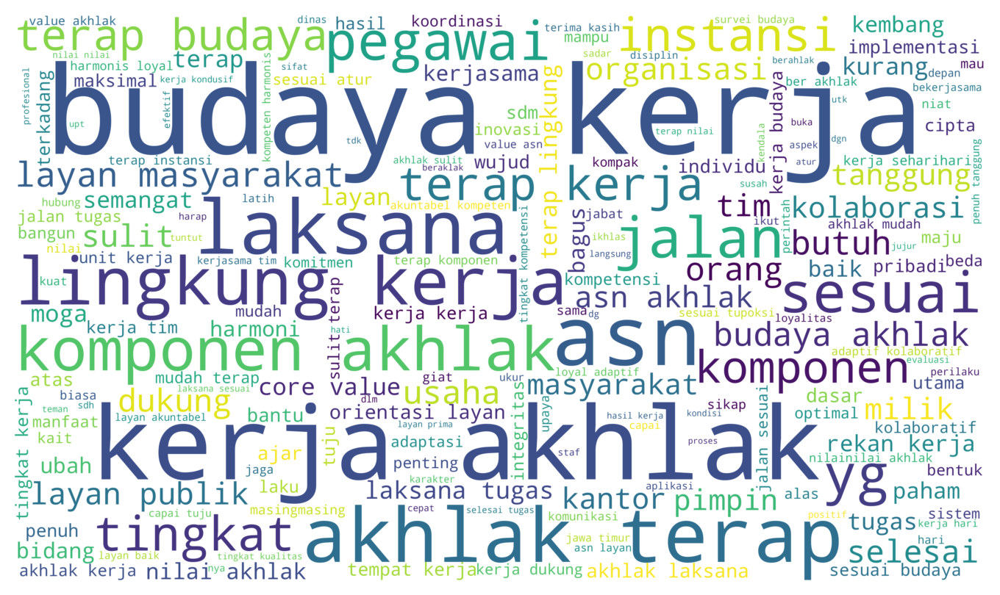

In [31]:
# Generate the word cloud
wordcloud = WordCloud(width=6000, height=3500, background_color='white', colormap='viridis').generate(all_pd_alasan)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")  # Hide axis
plt.show()

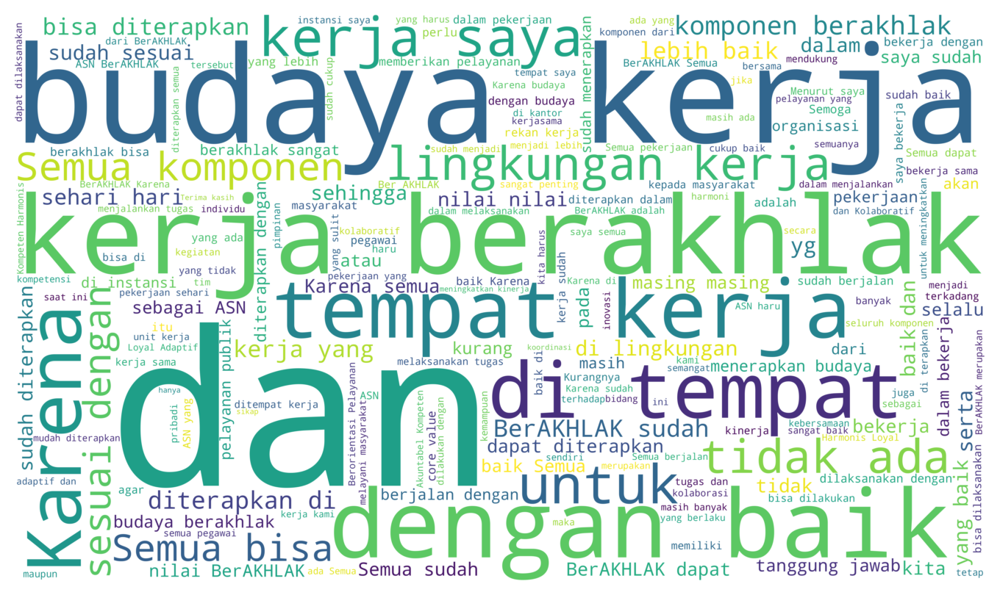

In [42]:
# Generate the word cloud
wordcloud = WordCloud(width=6000, height=3500, background_color='white', colormap='viridis').generate(all_pd_alasan_notstopwords)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")  # Hide axis
plt.show()

In [43]:
df_perangkat_daerah.head()

,nama,usia,jenis_kelamin,email,NIP,pd_uobk,instansi,uobk,unit_kerja,jabatan_fungsional,...,Akuntabel,Kompeten,Harmonis,Loyal,Adaptif,Kolaboratif,Tidak Ada,Dengan alasan...,_index,dengan_alasan_cleaned
0,"AIRIN NURNANINGSIH, SE",40,Perempuan,airinnurnaningsih05@gmail.,198504062015022016,Perangkat Daerah,BADAN KOORDINASI WILAYAH MALANG,NaN,NaN,Jabatan Fungsional,...,0,0,1,0,1,0,0,"level eselon sering terjadi miskomunikasi,, belum bisa menerima perubahan-perubahan baru",9,level eselon miskomunikasi terima perubahanperubahan
1,Sefrinda Gunawan,32,Perempuan,gsefrinda@gmail.com,199309202020121984,Perangkat Daerah,"DINAS PEMBERDAYAAN PEREMPUAN, PERLINDUNGAN ANAK DAN KEPENDUDUKAN",NaN,NaN,Jabatan Fungsional,...,0,0,1,0,0,0,0,Seringkali saran dan kritik diberikan dengan kalimat kurang sopan oleh beberapa oknum,10,seringkali saran kritik kalimat sopan oknum
2,Arum Putri Iswanti,31,Perempuan,arum.putri36@gmail.com,199308222023212000,Perangkat Daerah,"DINAS PEMBERDAYAAN PEREMPUAN, PERLINDUNGAN ANAK DAN KEPENDUDUKAN",NaN,NaN,PPPK,...,0,0,0,0,0,0,1,"Semua komponen berahlak bisa dilaksanakan dengan mudah, hanya jika kita menjadi pribadi yang profesional dalam bekerja",11,komponen berahlak laksana mudah pribadi profesional
23,FENI PUJI UTAMI,39,Perempuan,feniutty@gmail.com,198601292005012000,Perangkat Daerah,BIRO PEREKONOMIAN,NaN,NaN,Jabatan Fungsional,...,0,0,0,0,0,0,1,semua komponen telah diterapkan dalam Perangkat Daerah,38,komponen terap perangkat daerah
24,I Made Ngurah Iswara Mahaputra Sriada SA,30,Laki-laki,tuperekonomian3@gmail.com,199506092022040992,Perangkat Daerah,BIRO PEREKONOMIAN,NaN,NaN,Pelaksana,...,0,0,0,0,0,0,1,Pemahaman sebuah instansi khususnya terkait capaian kinerja dan penganggaran membutuhkan pemahaman secara mendalam dan komprehensif terkait isu dan permasalahan strategis yang dihadapi oleh sebuah...,39,paham instansi kait capai kerja anggar butuh paham dalam komprehensif kait isu masalah strategis hadap instansi tus loyalitas kolaborasi tingkat kompetensi bidangbidang instansi capai tuju sasar i...


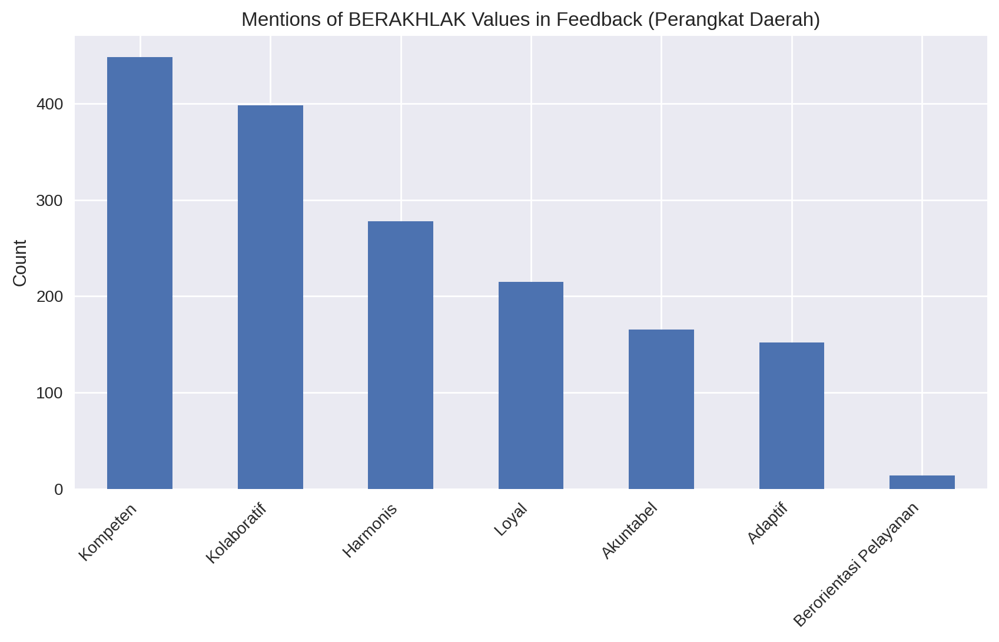

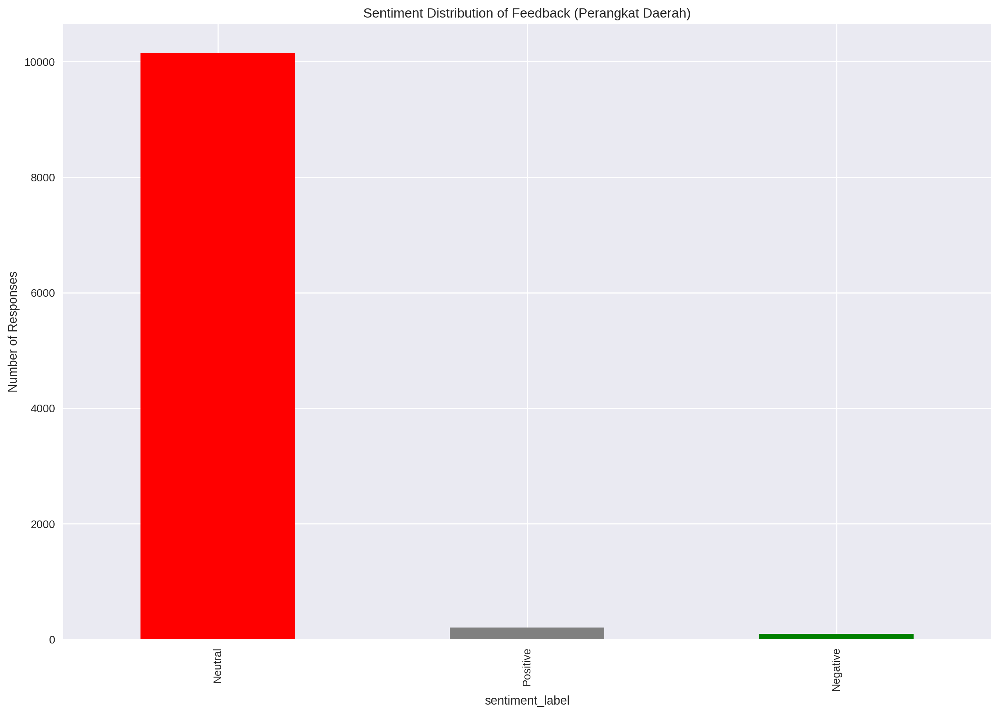

In [44]:
# =====================
# EDA on Feedback (BERAKHLAK Effectiveness)
# Using existing dataframe: df_perangkat_daerah
# =====================

from collections import Counter
from textblob import TextBlob
import matplotlib.pyplot as plt

# Make sure text column is string & lowercase (already done in cleaning)
# Use the cleaned column from df_perangkat_daerah
feedback_text = df_perangkat_daerah["dengan_alasan_cleaned"].astype(str).str.lower()

# Define BERAKHLAK values and related keywords
berakhlak_keywords = {
    "Berorientasi Pelayanan": ["pelayanan", "layanan", "melayani"],
    "Akuntabel": ["akuntabel", "transparan", "bertanggung"],
    "Kompeten": ["kompeten", "profesional", "ahli"],
    "Harmonis": ["harmonis", "rukun", "kerukunan"],
    "Loyal": ["loyal", "setia", "dedikasi"],
    "Adaptif": ["adaptif", "inovatif", "fleksibel"],
    "Kolaboratif": ["kolaboratif", "kerjasama", "gotong royong"]
}

# Count keyword frequencies
keyword_counts = {}
for value, keywords in berakhlak_keywords.items():
    # Use the feedback_text Series for counting
    count = feedback_text.str.contains("|".join(keywords), case=False, na=False).sum()
    keyword_counts[value] = count

freq_df = pd.DataFrame.from_dict(keyword_counts, orient="index", columns=["Mentions"])
freq_df = freq_df.sort_values("Mentions", ascending=False)

# Plot keyword mentions
freq_df.plot(kind="bar", legend=False, figsize=(10,5))
plt.title("Mentions of BERAKHLAK Values in Feedback (Perangkat Daerah)")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# Sentiment analysis
# Apply sentiment analysis to the feedback_text Series
sentiment_scores = feedback_text.apply(lambda x: TextBlob(x).sentiment.polarity)

feedback_sentiment = pd.DataFrame({
    "text": feedback_text,
    "sentiment": sentiment_scores
})

feedback_sentiment["sentiment_label"] = pd.cut(feedback_sentiment["sentiment"],
                                          bins=[-1, -0.05, 0.05, 1],
                                          labels=["Negative", "Neutral", "Positive"])

sent_summary = feedback_sentiment["sentiment_label"].value_counts()
sent_summary.plot(kind="bar", color=["red", "gray", "green"])
plt.title("Sentiment Distribution of Feedback (Perangkat Daerah)")
plt.ylabel("Number of Responses")
plt.show()

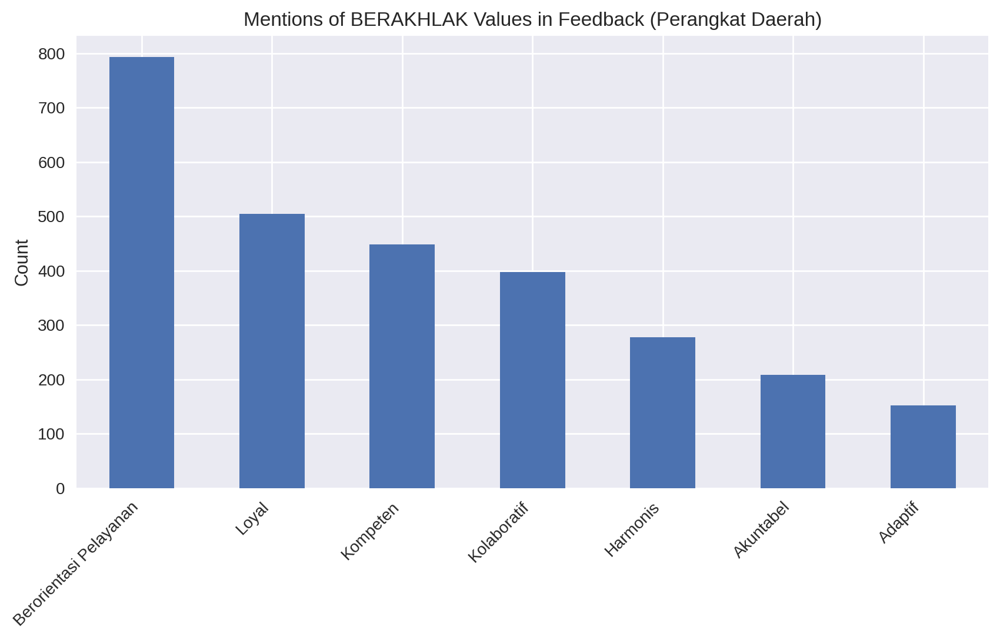

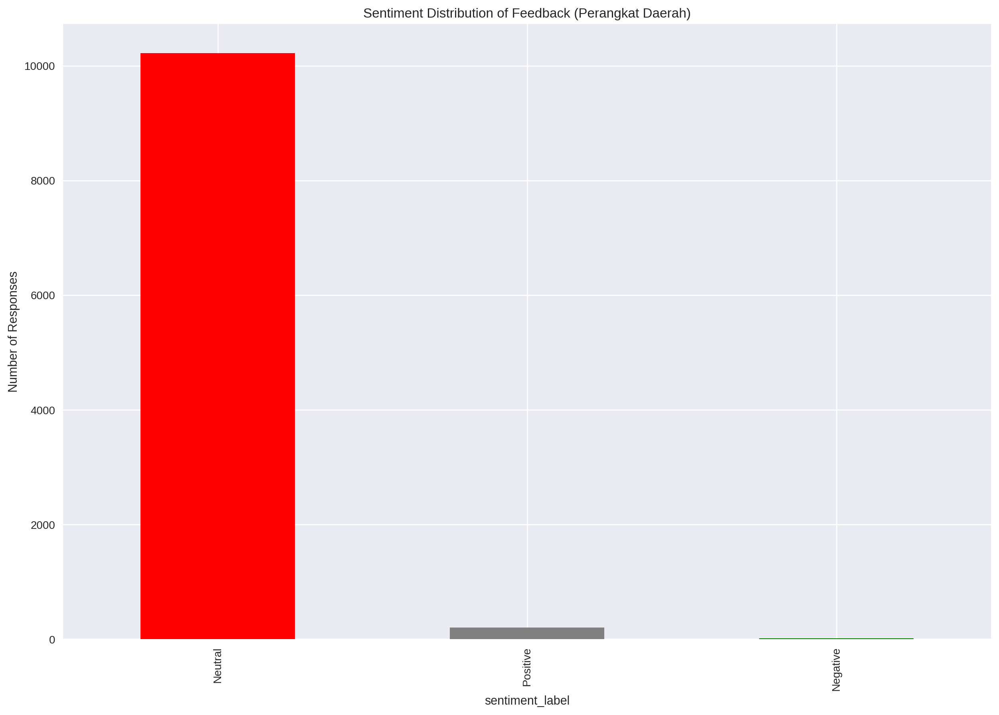

In [45]:
# =====================
# EDA on Feedback (BERAKHLAK Effectiveness)
# Using existing dataframe: df_perangkat_daerah
# =====================

from collections import Counter
from textblob import TextBlob
import matplotlib.pyplot as plt

# Make sure text column is string & lowercase (already done in cleaning)
# Use the cleaned column from df_perangkat_daerah
feedback_text = df_perangkat_daerah["Dengan alasan..."].astype(str).str.lower()

# Define BERAKHLAK values and related keywords
berakhlak_keywords = {
    "Berorientasi Pelayanan": ["pelayanan", "layanan", "melayani"],
    "Akuntabel": ["akuntabel", "transparan", "bertanggung"],
    "Kompeten": ["kompeten", "profesional", "ahli"],
    "Harmonis": ["harmonis", "rukun", "kerukunan"],
    "Loyal": ["loyal", "setia", "dedikasi"],
    "Adaptif": ["adaptif", "inovatif", "fleksibel"],
    "Kolaboratif": ["kolaboratif", "kerjasama", "gotong royong"]
}

# Count keyword frequencies
keyword_counts = {}
for value, keywords in berakhlak_keywords.items():
    # Use the feedback_text Series for counting
    count = feedback_text.str.contains("|".join(keywords), case=False, na=False).sum()
    keyword_counts[value] = count

freq_df = pd.DataFrame.from_dict(keyword_counts, orient="index", columns=["Mentions"])
freq_df = freq_df.sort_values("Mentions", ascending=False)

# Plot keyword mentions
freq_df.plot(kind="bar", legend=False, figsize=(10,5))
plt.title("Mentions of BERAKHLAK Values in Feedback (Perangkat Daerah)")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# Sentiment analysis
# Apply sentiment analysis to the feedback_text Series
sentiment_scores = feedback_text.apply(lambda x: TextBlob(x).sentiment.polarity)

feedback_sentiment = pd.DataFrame({
    "text": feedback_text,
    "sentiment": sentiment_scores
})

feedback_sentiment["sentiment_label"] = pd.cut(feedback_sentiment["sentiment"],
                                          bins=[-1, -0.05, 0.05, 1],
                                          labels=["Negative", "Neutral", "Positive"])

sent_summary = feedback_sentiment["sentiment_label"].value_counts()
sent_summary.plot(kind="bar", color=["red", "gray", "green"])
plt.title("Sentiment Distribution of Feedback (Perangkat Daerah)")
plt.ylabel("Number of Responses")
plt.show()


Top 10 instansi for Berorientasi Pelayanan:


,instansi,Berorientasi Pelayanan,Berorientasi Pelayanan_pct
45,DINAS SOSIAL,90,12.987013
8,BADAN PENDAPATAN DAERAH,74,10.755814
38,DINAS PERHUBUNGAN,53,8.294210
28,DINAS KESEHATAN,51,6.649283
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,49,6.824513
32,DINAS PEKERJAAN UMUM BINA MARGA,41,7.592593
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,41,6.879195
37,DINAS PENDIDIKAN INDUK,36,9.651475
26,DINAS KELAUTAN DAN PERIKANAN,31,6.935123
0,BADAN KEPEGAWAIAN DAERAH,26,10.196078



Top 10 instansi for Akuntabel:


,instansi,Akuntabel,Akuntabel_pct
32,DINAS PEKERJAAN UMUM BINA MARGA,18,3.333333
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,17,2.367688
45,DINAS SOSIAL,15,2.164502
28,DINAS KESEHATAN,13,1.694915
8,BADAN PENDAPATAN DAERAH,12,1.744186
26,DINAS KELAUTAN DAN PERIKANAN,12,2.684564
38,DINAS PERHUBUNGAN,9,1.408451
33,DINAS PEKERJAAN UMUM SUMBER DAYA AIR,9,2.564103
37,DINAS PENDIDIKAN INDUK,8,2.144772
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,8,1.342282



Top 10 instansi for Kompeten:


,instansi,Kompeten,Kompeten_pct
8,BADAN PENDAPATAN DAERAH,36,5.232558
38,DINAS PERHUBUNGAN,27,4.225352
37,DINAS PENDIDIKAN INDUK,25,6.702413
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,22,3.064067
45,DINAS SOSIAL,22,3.174603
28,DINAS KESEHATAN,21,2.737940
25,DINAS KEHUTANAN,21,4.077670
26,DINAS KELAUTAN DAN PERIKANAN,20,4.474273
32,DINAS PEKERJAAN UMUM BINA MARGA,19,3.518519
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,19,3.187919



Top 10 instansi for Harmonis:


,instansi,Harmonis,Harmonis_pct
45,DINAS SOSIAL,26,3.751804
8,BADAN PENDAPATAN DAERAH,20,2.906977
32,DINAS PEKERJAAN UMUM BINA MARGA,16,2.962963
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,16,2.228412
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,15,2.516779
37,DINAS PENDIDIKAN INDUK,15,4.021448
26,DINAS KELAUTAN DAN PERIKANAN,12,2.684564
33,DINAS PEKERJAAN UMUM SUMBER DAYA AIR,12,3.418803
28,DINAS KESEHATAN,12,1.564537
38,DINAS PERHUBUNGAN,12,1.877934



Top 10 instansi for Loyal:


,instansi,Loyal,Loyal_pct
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,42,5.849582
28,DINAS KESEHATAN,38,4.954368
38,DINAS PERHUBUNGAN,37,5.790297
45,DINAS SOSIAL,31,4.473304
32,DINAS PEKERJAAN UMUM BINA MARGA,28,5.185185
8,BADAN PENDAPATAN DAERAH,27,3.924419
37,DINAS PENDIDIKAN INDUK,26,6.970509
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,26,4.362416
25,DINAS KEHUTANAN,21,4.077670
26,DINAS KELAUTAN DAN PERIKANAN,18,4.026846



Top 10 instansi for Adaptif:


,instansi,Adaptif,Adaptif_pct
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,14,1.949861
8,BADAN PENDAPATAN DAERAH,12,1.744186
33,DINAS PEKERJAAN UMUM SUMBER DAYA AIR,10,2.849003
45,DINAS SOSIAL,8,1.154401
32,DINAS PEKERJAAN UMUM BINA MARGA,7,1.296296
37,DINAS PENDIDIKAN INDUK,6,1.608579
38,DINAS PERHUBUNGAN,6,0.938967
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,6,1.006711
25,DINAS KEHUTANAN,6,1.165049
17,BIRO KESEJAHTERAAN RAKYAT,6,7.894737



Top 10 instansi for Kolaboratif:


,instansi,Kolaboratif,Kolaboratif_pct
28,DINAS KESEHATAN,35,4.563233
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,26,3.621170
37,DINAS PENDIDIKAN INDUK,24,6.434316
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,24,4.026846
38,DINAS PERHUBUNGAN,23,3.599374
33,DINAS PEKERJAAN UMUM SUMBER DAYA AIR,21,5.982906
45,DINAS SOSIAL,20,2.886003
8,BADAN PENDAPATAN DAERAH,17,2.470930
25,DINAS KEHUTANAN,15,2.912621
32,DINAS PEKERJAAN UMUM BINA MARGA,15,2.777778


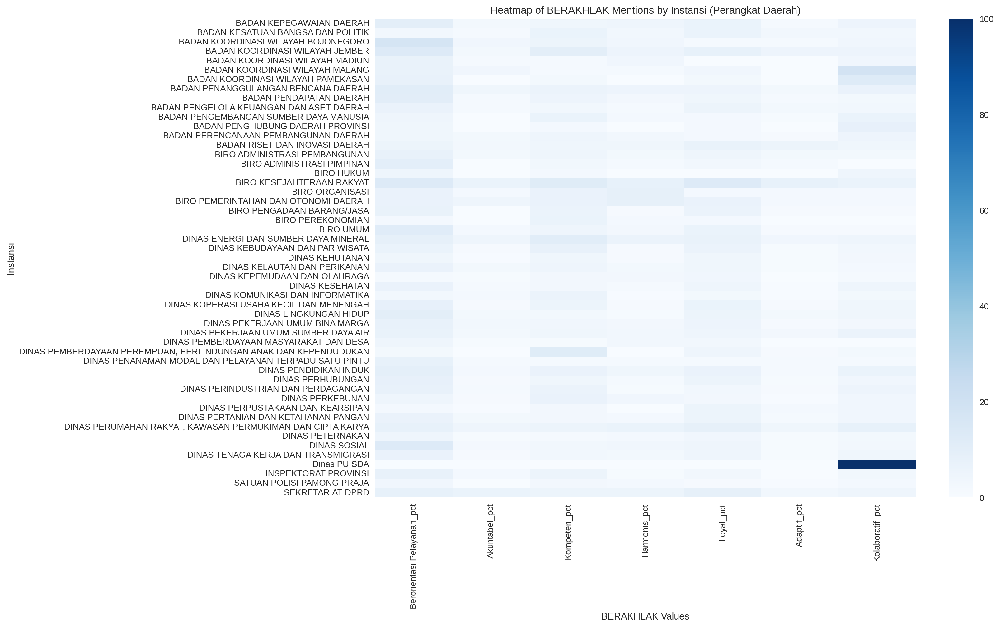

In [62]:
import seaborn as sns

# Step 1: Function to count BERAKHLAK per instansi
def count_keywords_by_instansi(df_perangkat_daerah, keywords_dict):
    results = []
    for instansi, group in df_perangkat_daerah.groupby("instansi"):
        row = {"instansi": instansi, "total_feedback": len(group)}
        for value, keywords in keywords_dict.items():
            row[value] = group["Dengan alasan..."].str.contains("|".join(keywords), case=False, na=False).sum()
        results.append(row)
    return pd.DataFrame(results)

# Count per instansi for PERANGKAT DAERAH
instansi_counts_pd = count_keywords_by_instansi(all_pd_alasan, berakhlak_keywords)

# Step 2: Normalize (percentage mentions)
for value in berakhlak_keywords.keys():
    instansi_counts_pd[value + "_pct"] = instansi_counts_pd[value] / instansi_counts_pd["total_feedback"] * 100

# Step 3: Show top 10 instansi for each value
for value in berakhlak_keywords.keys():
    print(f"\nTop 10 instansi for {value}:")
    display(instansi_counts_pd[["instansi", value, value + "_pct"]].sort_values(by=value, ascending=False).head(10))

# Step 4: Heatmap (percentage values only)
heatmap_df = instansi_counts_pd.set_index("instansi")[[v+"_pct" for v in berakhlak_keywords.keys()]]
plt.figure(figsize=(14,10))
sns.heatmap(heatmap_df, cmap="Blues", annot=False, cbar=True)
plt.title("Heatmap of BERAKHLAK Mentions by Instansi (Perangkat Daerah)")
plt.ylabel("Instansi")
plt.xlabel("BERAKHLAK Values")
plt.show()


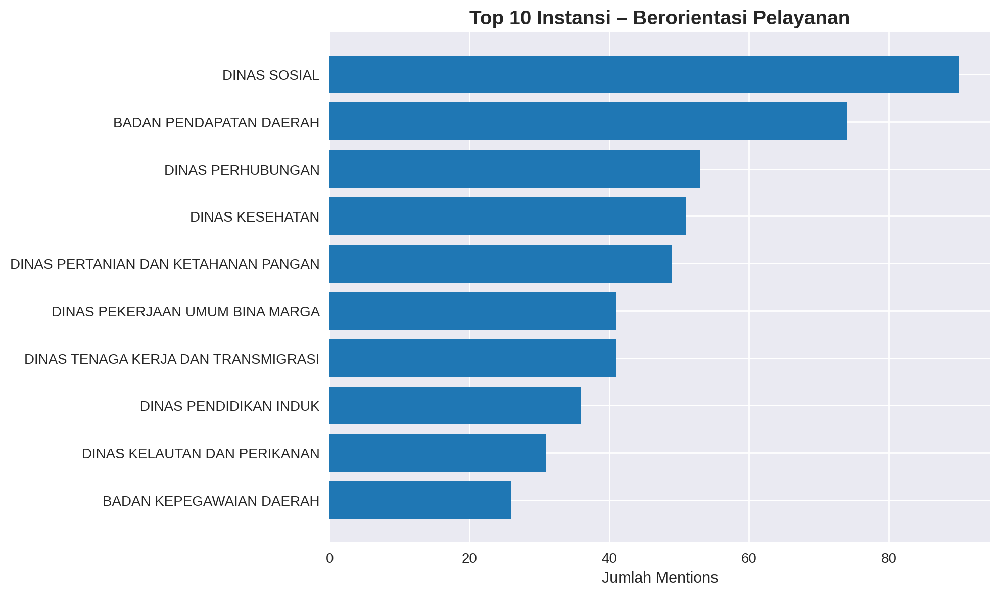

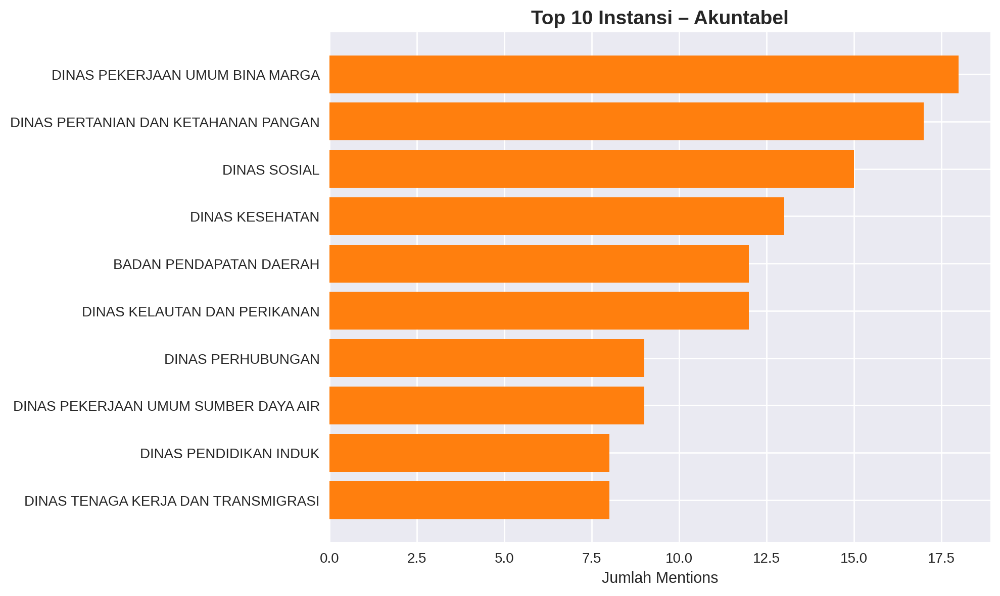

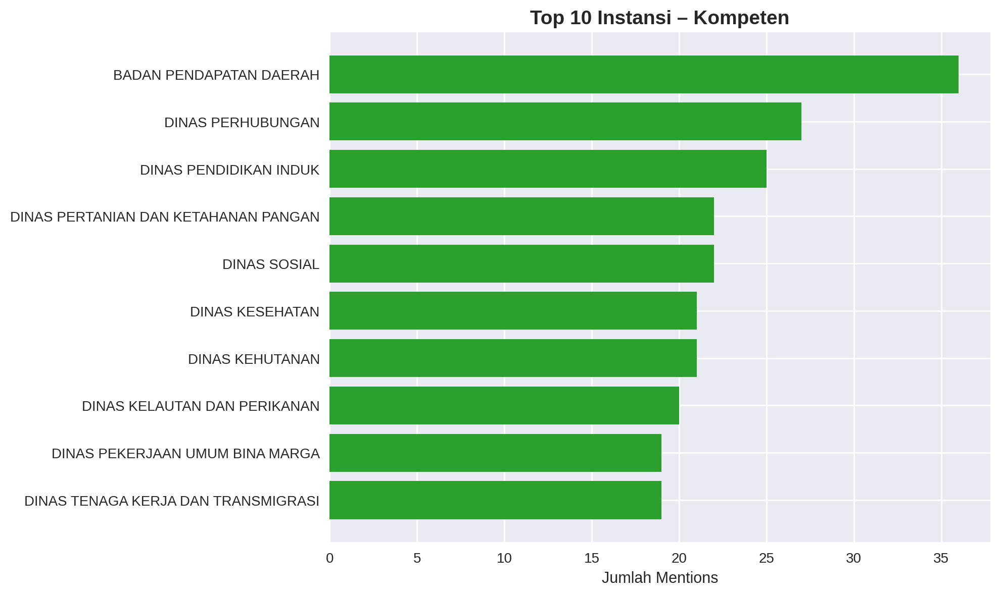

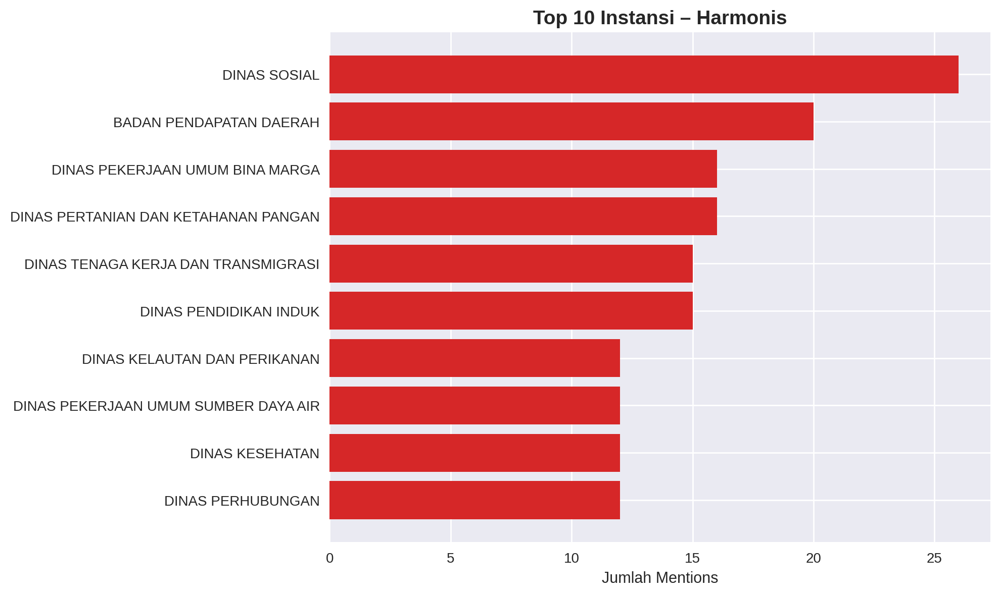

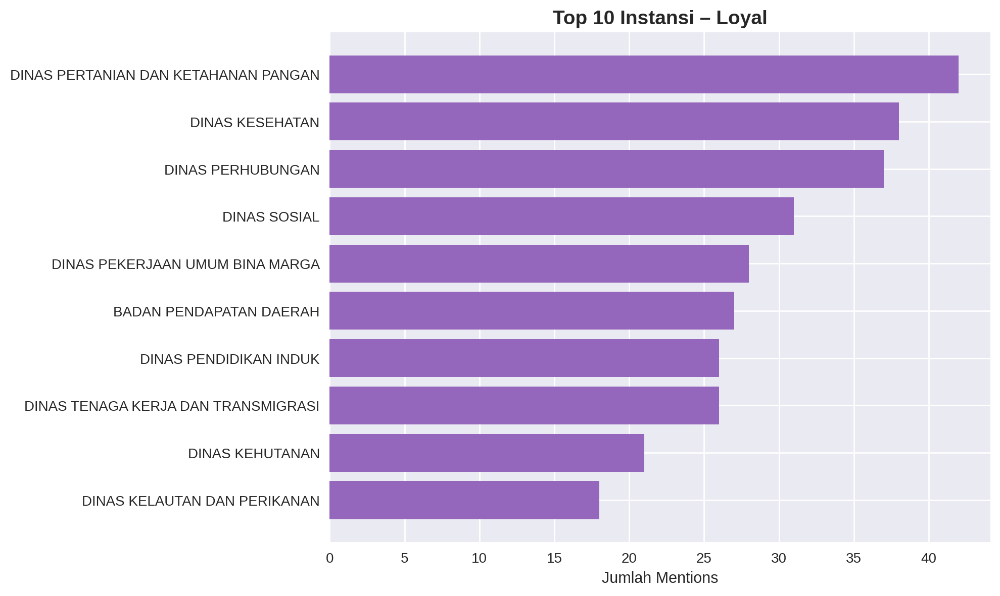

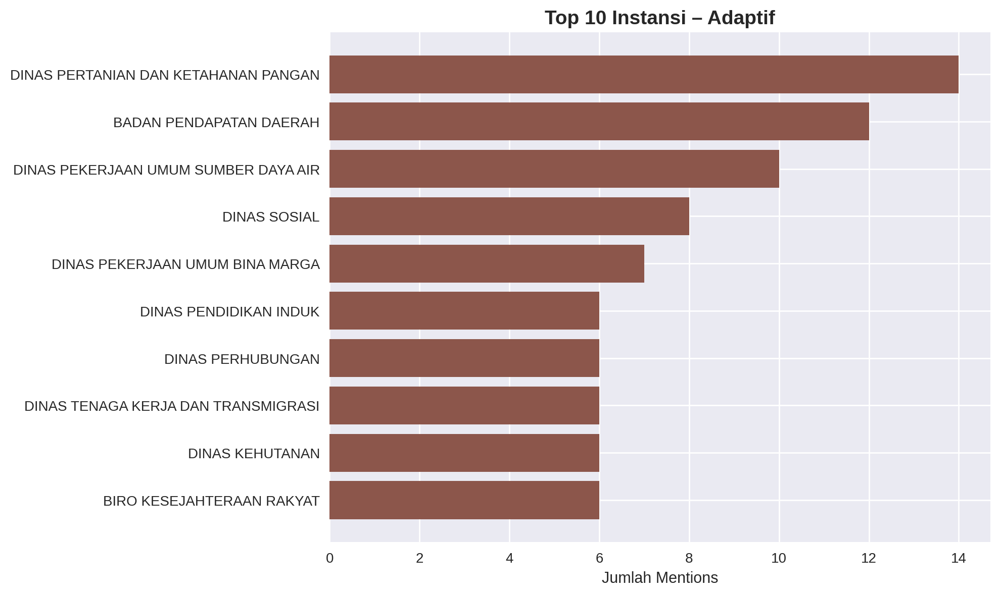

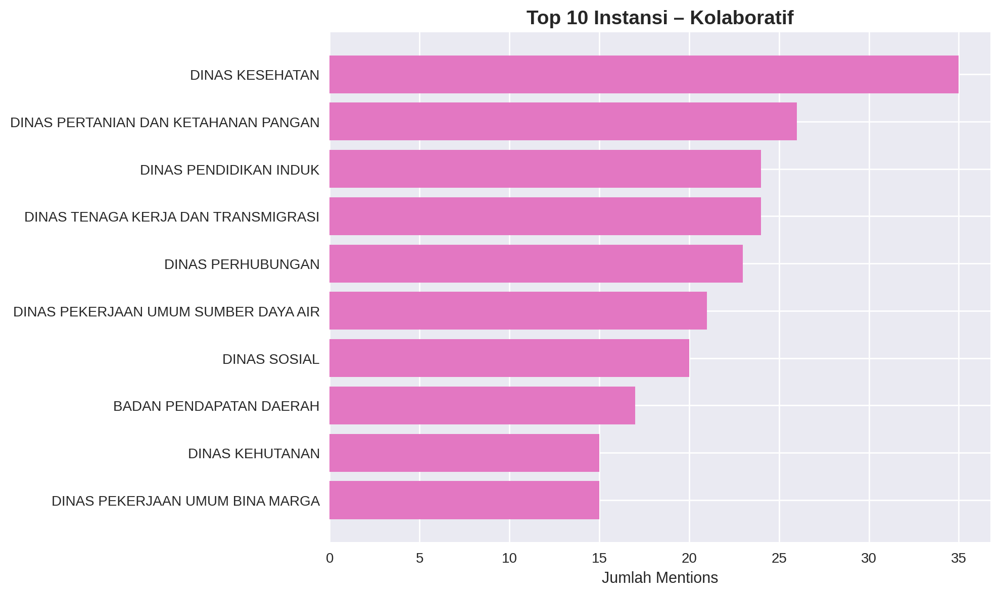

In [49]:
import matplotlib.pyplot as plt

# Assign fixed colors for each BERAKHLAK keyword
colors = {
    "Berorientasi Pelayanan": "tab:blue",
    "Akuntabel": "tab:orange",
    "Kompeten": "tab:green",
    "Harmonis": "tab:red",
    "Loyal": "tab:purple",
    "Adaptif": "tab:brown",
    "Kolaboratif": "tab:pink"
}

# Loop through each BERAKHLAK keyword and plot Top 10 instansi
for value in berakhlak_keywords.keys():
    top10 = instansi_counts_pd[["instansi", value, value + "_pct"]].sort_values(by=value, ascending=False).head(10)

    plt.figure(figsize=(10,6))
    plt.barh(top10["instansi"], top10[value], color=colors.get(value, "gray"))
    plt.gca().invert_yaxis()  # highest on top
    plt.xlabel("Jumlah Mentions")
    plt.title(f"Top 10 Instansi – {value}", fontsize=14, weight="bold")
    plt.tight_layout()
    plt.show()


# Wordcloud Analysis UOBK

In [50]:
import nltk
nltk.download('punkt_tab')
nltk.download('wordnet')

from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from nltk.stem import WordNetLemmatizer

factory = StemmerFactory()
stemmer = factory.create_stemmer()
lemmatizer = WordNetLemmatizer()


def clean_text(text):
    # Case lowering
    text = str(text).lower()

    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Tokenization
    words = word_tokenize(text)

    # Remove stopwords
    words = [word for word in words if word not in indonesian_stopwords]

    # Stemming
    words = [stemmer.stem(word) for word in words]

    # Lemmatization (requires a part-of-speech tag for optimal results, using 'v' for verb as a default)
    lemmatized_words = [lemmatizer.lemmatize(word, 'v') for word in words]
    text = ' '.join(lemmatized_words)

    return text


# Apply the updated cleaning function to the 'review' column
df_uobk['Dengan alasan..._cleaned'] = df_uobk['Dengan alasan...'].apply(clean_text)

# Display the DataFrame with the cleaned reviews
print(df_uobk[['Dengan alasan...', 'Dengan alasan..._cleaned']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


                                             Dengan alasan...  \
3                                    masih ada ego tersendiri   
4              Berakhlak mudah diterapkan ditugas sehari hari   
5                                       Masih ada orang egois   
6                                                           -   
7      Berakhlak bisa di terapkan dalam pekerjaan sehari hari   
...                                                       ...   
16625                             bisa diterapkan dengan baik   
16626                                                       .   
16627        Penerapan budaya kerja dapat dilakukan dimanapun   
16628                                    semua sudah berjalan   
16633                            sudah diterapkan di instansi   

            Dengan alasan..._cleaned  
3                        ego sendiri  
4      akhlak mudah terap tugas hari  
5                        orang egois  
6                                     
7            akhlak tera

/tmp/ipython-input-22872608.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_uobk['Dengan alasan..._cleaned'] = df_uobk['Dengan alasan...'].apply(clean_text)


In [53]:
#Join seluruh user review dalam satu corpus
all_uobk_alasan = ' '.join(df_uobk['Dengan alasan..._cleaned'])

In [54]:
#Join seluruh user review dalam satu corpus
all_uobk_alasan_nostopword = ' '.join(df_uobk['Dengan alasan...'])

In [55]:
# Convert the string to a pandas Series
all_uobk_alasan_series = pd.Series(all_uobk_alasan)

# Save the Series to a CSV file
all_uobk_alasan_series.to_csv('all_uobk_alasan.csv', index=False)

In [56]:
# Convert the string to a pandas Series
all_uobk_alasan_nostopword_series = pd.Series(all_uobk_alasan_nostopword)

# Save the Series to a CSV file
all_uobk_alasan_nostopword_series.to_csv('all_uobk_alasan_nostopword.csv', index=False)

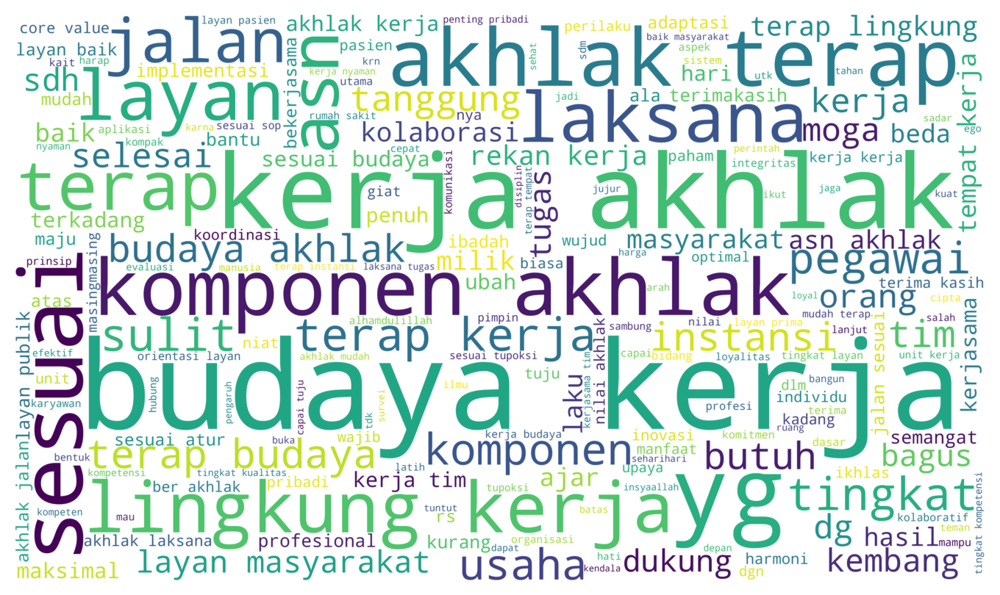

In [60]:
# Generate the word cloud
wordcloud = WordCloud(width=6000, height=3500, background_color='white', colormap='viridis').generate(all_uobk_alasan)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")  # Hide axis
plt.show()

/tmp/ipython-input-1505426086.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_uobk["clean_text"] = df_uobk["Dengan alasan..."].astype(str).str.lower()
/tmp/ipython-input-1505426086.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_uobk[value] = df_uobk["clean_text"].str.contains("|".join(keywords), case=False, na=False)


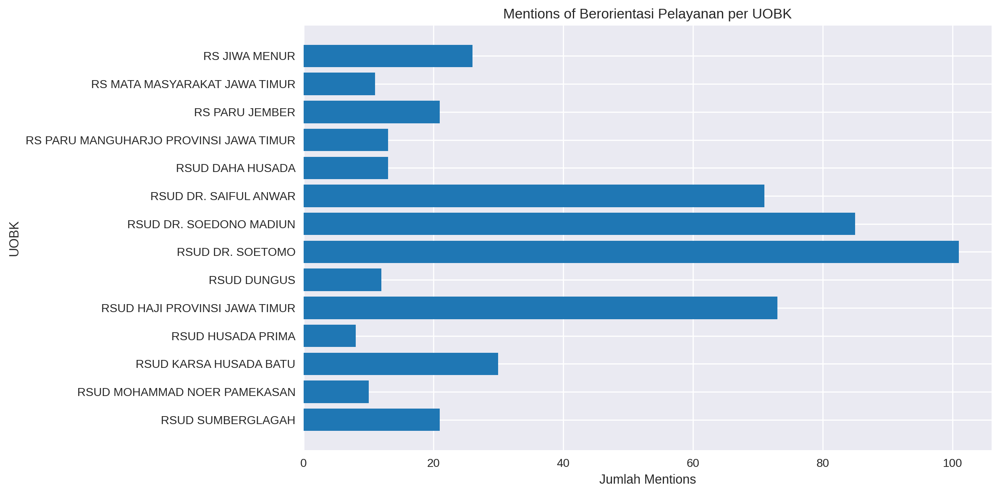

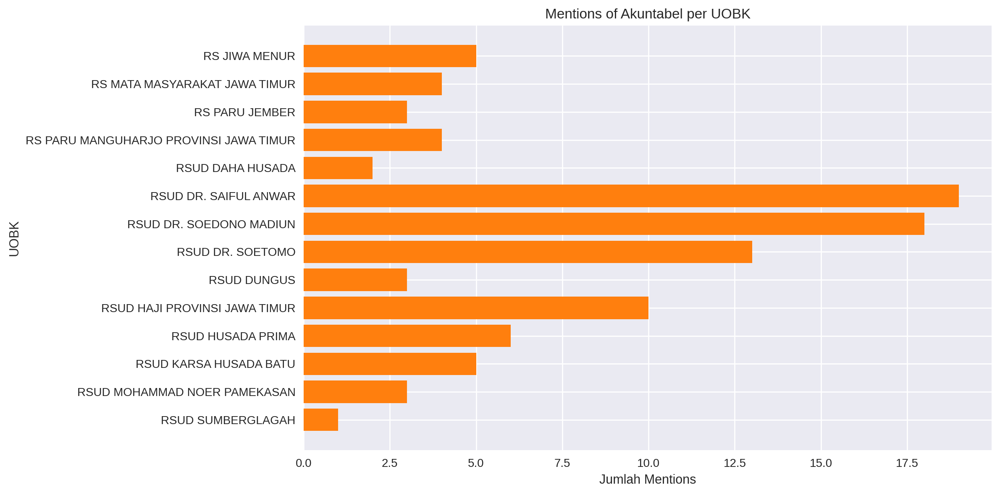

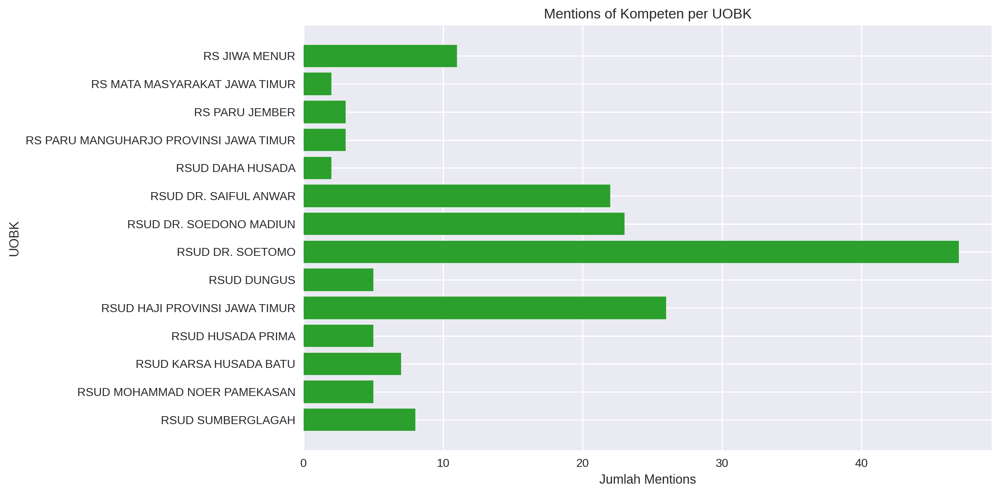

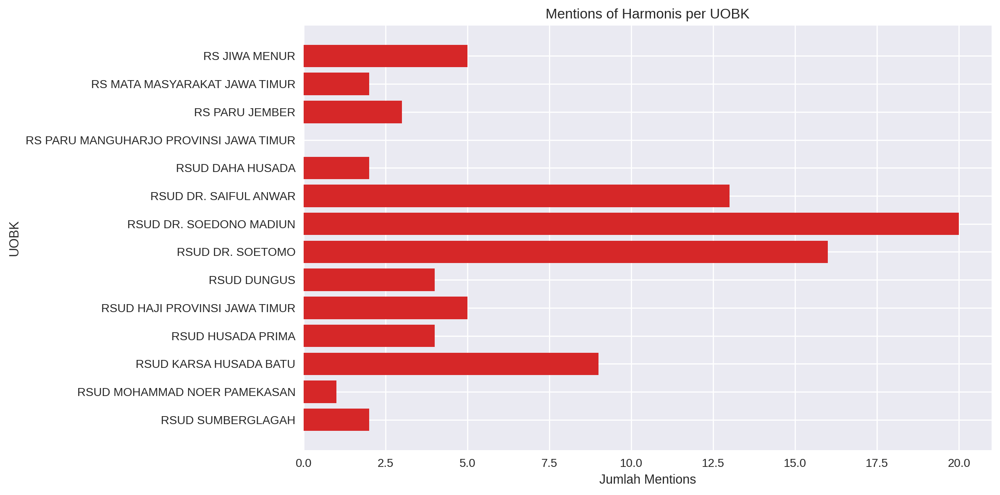

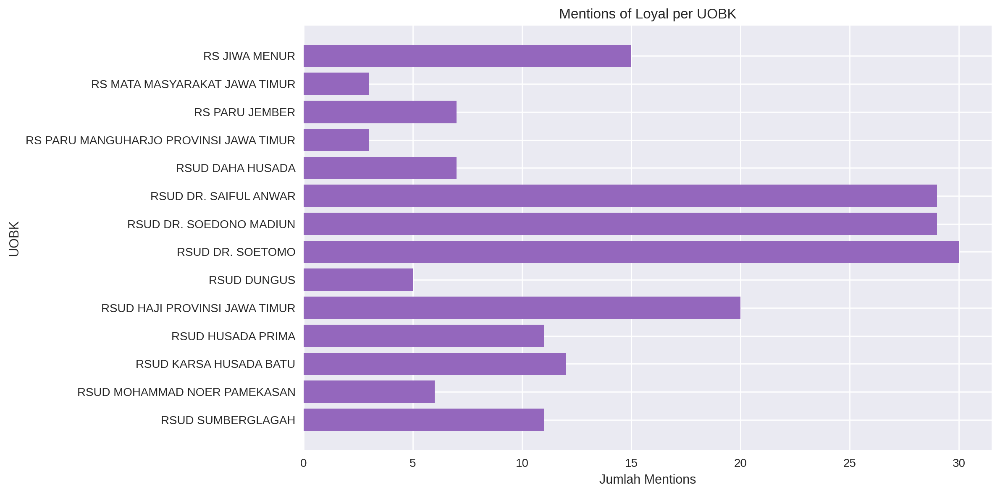

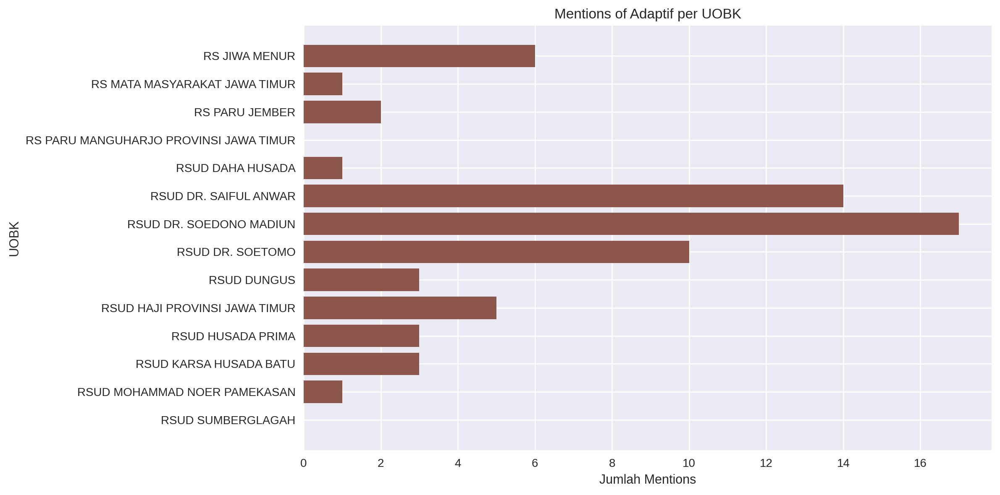

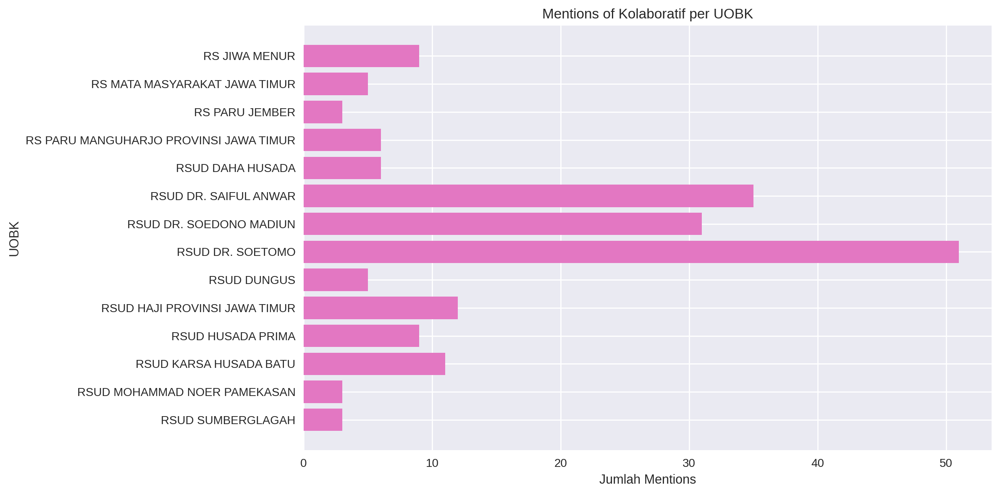

In [59]:
# =====================
# EDA on Feedback (BERAKHLAK Effectiveness)
# Grouped by column: uobk (ALL 14 hospitals)
# =====================

import pandas as pd
import matplotlib.pyplot as plt

# Make sure text column is string & lowercase
df_uobk["clean_text"] = df_uobk["Dengan alasan..."].astype(str).str.lower()

# Define BERAKHLAK values and related keywords
berakhlak_keywords = {
    "Berorientasi Pelayanan": ["pelayanan", "layanan", "melayani"],
    "Akuntabel": ["akuntabel", "transparan", "bertanggung"],
    "Kompeten": ["kompeten", "profesional", "ahli"],
    "Harmonis": ["harmonis", "rukun", "kerukunan"],
    "Loyal": ["loyal", "setia", "dedikasi"],
    "Adaptif": ["adaptif", "inovatif", "fleksibel"],
    "Kolaboratif": ["kolaboratif", "kerjasama", "gotong royong"]
}

# Create keyword match columns per BERAKHLAK value
for value, keywords in berakhlak_keywords.items():
    df_uobk[value] = df_uobk["clean_text"].str.contains("|".join(keywords), case=False, na=False)

# Group by column "uobk"
uobk_counts = df_uobk.groupby("uobk")[list(berakhlak_keywords.keys())].sum().reset_index()

# Colors for consistency
colors = {
    "Berorientasi Pelayanan": "tab:blue",
    "Akuntabel": "tab:orange",
    "Kompeten": "tab:green",
    "Harmonis": "tab:red",
    "Loyal": "tab:purple",
    "Adaptif": "tab:brown",
    "Kolaboratif": "tab:pink"
}

# Plot ALL 14 UOBK for each BERAKHLAK value
for value in berakhlak_keywords.keys():
    plt.figure(figsize=(12,6))
    plt.barh(uobk_counts["uobk"], uobk_counts[value], color=colors.get(value, "gray"))
    plt.gca().invert_yaxis()
    plt.title(f"Mentions of {value} per UOBK")
    plt.xlabel("Jumlah Mentions")
    plt.ylabel("UOBK")
    plt.tight_layout()
    plt.show()


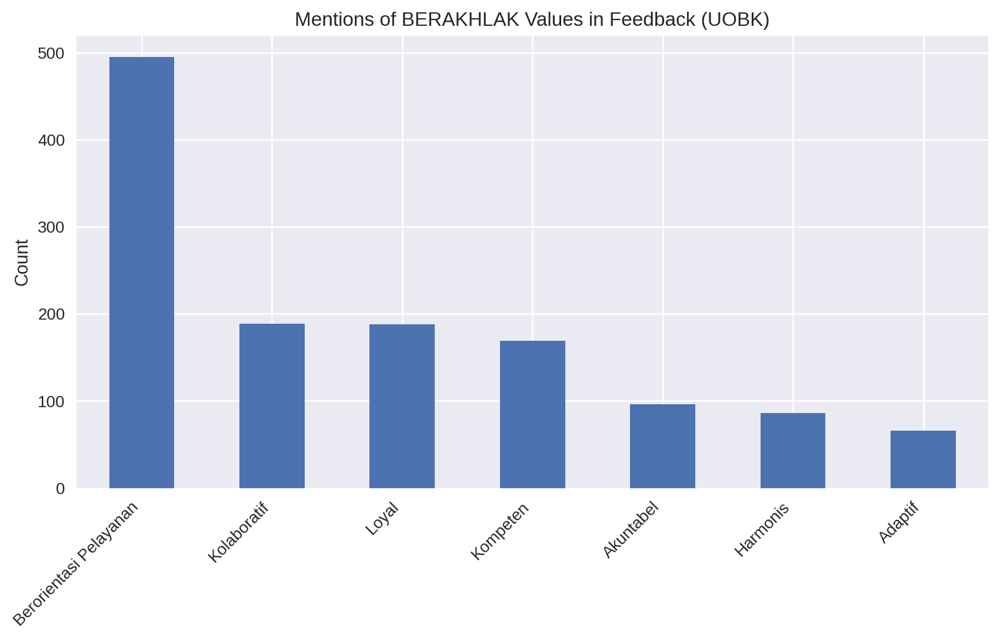

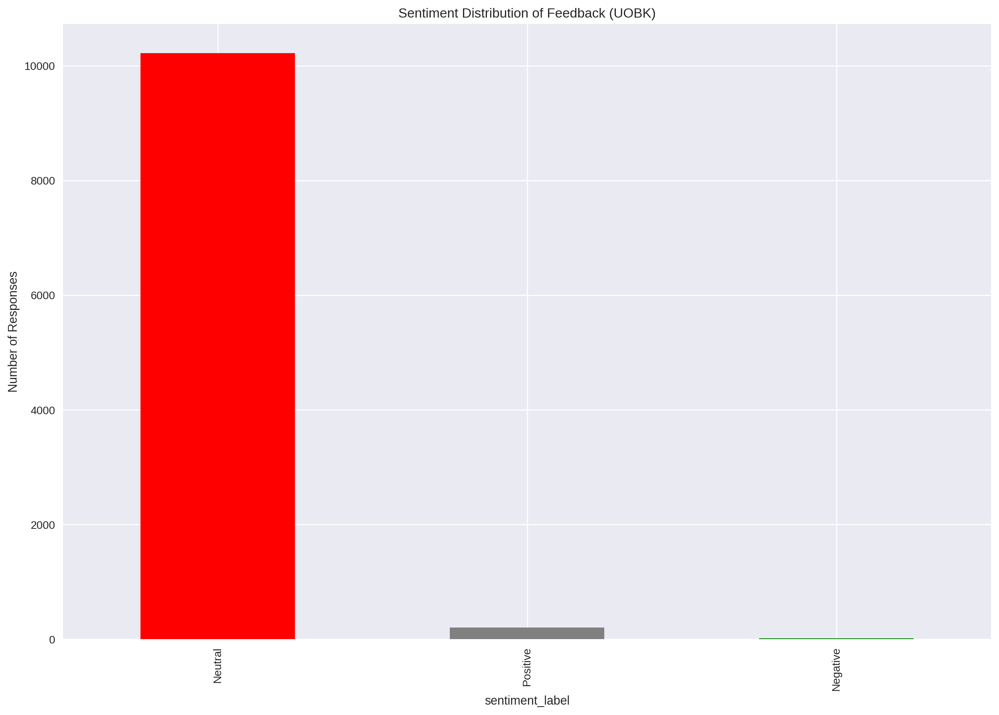

In [61]:
# =====================
# EDA on Feedback (BERAKHLAK Effectiveness)
# Using existing dataframe: df_uobk
# =====================

from collections import Counter
from textblob import TextBlob
import matplotlib.pyplot as plt

# Make sure text column is string & lowercase (already done in cleaning)
# Use the cleaned column from df_perangkat_daerah
feedback_text_uobk = df_uobk["Dengan alasan..."].astype(str).str.lower()

# Define BERAKHLAK values and related keywords
berakhlak_keywords = {
    "Berorientasi Pelayanan": ["pelayanan", "layanan", "melayani"],
    "Akuntabel": ["akuntabel", "transparan", "bertanggung"],
    "Kompeten": ["kompeten", "profesional", "ahli"],
    "Harmonis": ["harmonis", "rukun", "kerukunan"],
    "Loyal": ["loyal", "setia", "dedikasi"],
    "Adaptif": ["adaptif", "inovatif", "fleksibel"],
    "Kolaboratif": ["kolaboratif", "kerjasama", "gotong royong"]
}

# Count keyword frequencies
keyword_counts = {}
for value, keywords in berakhlak_keywords.items():
    # Use the feedback_text Series for counting
    count = feedback_text_uobk.str.contains("|".join(keywords), case=False, na=False).sum()
    keyword_counts[value] = count

freq_df = pd.DataFrame.from_dict(keyword_counts, orient="index", columns=["Mentions"])
freq_df = freq_df.sort_values("Mentions", ascending=False)

# Plot keyword mentions
freq_df.plot(kind="bar", legend=False, figsize=(10,5))
plt.title("Mentions of BERAKHLAK Values in Feedback (UOBK)")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.show()

# Sentiment analysis
# Apply sentiment analysis to the feedback_text Series
sentiment_scores = feedback_text.apply(lambda x: TextBlob(x).sentiment.polarity)

feedback_sentiment = pd.DataFrame({
    "text": feedback_text,
    "sentiment": sentiment_scores
})

feedback_sentiment["sentiment_label"] = pd.cut(feedback_sentiment["sentiment"],
                                          bins=[-1, -0.05, 0.05, 1],
                                          labels=["Negative", "Neutral", "Positive"])

sent_summary = feedback_sentiment["sentiment_label"].value_counts()
sent_summary.plot(kind="bar", color=["red", "gray", "green"])
plt.title("Sentiment Distribution of Feedback (UOBK)")
plt.ylabel("Number of Responses")
plt.show()


UOBK ranking for Berorientasi Pelayanan:


,uobk,Berorientasi Pelayanan,Berorientasi Pelayanan_pct
7,RSUD DR. SOETOMO,101,7.077786
6,RSUD DR. SOEDONO MADIUN,85,9.433962
9,RSUD HAJI PROVINSI JAWA TIMUR,73,9.517601
5,RSUD DR. SAIFUL ANWAR,71,8.323564
11,RSUD KARSA HUSADA BATU,30,8.403361
0,RS JIWA MENUR,26,7.715134
13,RSUD SUMBERGLAGAH,21,7.553957
2,RS PARU JEMBER,21,9.251101
3,RS PARU MANGUHARJO PROVINSI JAWA TIMUR,13,9.154930
4,RSUD DAHA HUSADA,13,7.262570



UOBK ranking for Akuntabel:


,uobk,Akuntabel,Akuntabel_pct
5,RSUD DR. SAIFUL ANWAR,19,2.227433
6,RSUD DR. SOEDONO MADIUN,18,1.997780
7,RSUD DR. SOETOMO,13,0.911002
9,RSUD HAJI PROVINSI JAWA TIMUR,10,1.303781
10,RSUD HUSADA PRIMA,6,2.620087
0,RS JIWA MENUR,5,1.483680
11,RSUD KARSA HUSADA BATU,5,1.400560
1,RS MATA MASYARAKAT JAWA TIMUR,4,2.547771
3,RS PARU MANGUHARJO PROVINSI JAWA TIMUR,4,2.816901
2,RS PARU JEMBER,3,1.321586



UOBK ranking for Kompeten:


,uobk,Kompeten,Kompeten_pct
7,RSUD DR. SOETOMO,47,3.293623
9,RSUD HAJI PROVINSI JAWA TIMUR,26,3.389831
6,RSUD DR. SOEDONO MADIUN,23,2.552719
5,RSUD DR. SAIFUL ANWAR,22,2.579132
0,RS JIWA MENUR,11,3.264095
13,RSUD SUMBERGLAGAH,8,2.877698
11,RSUD KARSA HUSADA BATU,7,1.960784
8,RSUD DUNGUS,5,2.358491
10,RSUD HUSADA PRIMA,5,2.183406
12,RSUD MOHAMMAD NOER PAMEKASAN,5,3.787879



UOBK ranking for Harmonis:


,uobk,Harmonis,Harmonis_pct
6,RSUD DR. SOEDONO MADIUN,20,2.219756
7,RSUD DR. SOETOMO,16,1.121233
5,RSUD DR. SAIFUL ANWAR,13,1.524033
11,RSUD KARSA HUSADA BATU,9,2.521008
9,RSUD HAJI PROVINSI JAWA TIMUR,5,0.651890
0,RS JIWA MENUR,5,1.483680
8,RSUD DUNGUS,4,1.886792
10,RSUD HUSADA PRIMA,4,1.746725
2,RS PARU JEMBER,3,1.321586
1,RS MATA MASYARAKAT JAWA TIMUR,2,1.273885



UOBK ranking for Loyal:


,uobk,Loyal,Loyal_pct
7,RSUD DR. SOETOMO,30,2.102313
5,RSUD DR. SAIFUL ANWAR,29,3.399766
6,RSUD DR. SOEDONO MADIUN,29,3.218646
9,RSUD HAJI PROVINSI JAWA TIMUR,20,2.607562
0,RS JIWA MENUR,15,4.451039
11,RSUD KARSA HUSADA BATU,12,3.361345
13,RSUD SUMBERGLAGAH,11,3.956835
10,RSUD HUSADA PRIMA,11,4.803493
2,RS PARU JEMBER,7,3.083700
4,RSUD DAHA HUSADA,7,3.910615



UOBK ranking for Adaptif:


,uobk,Adaptif,Adaptif_pct
6,RSUD DR. SOEDONO MADIUN,17,1.886792
5,RSUD DR. SAIFUL ANWAR,14,1.641266
7,RSUD DR. SOETOMO,10,0.700771
0,RS JIWA MENUR,6,1.780415
9,RSUD HAJI PROVINSI JAWA TIMUR,5,0.651890
8,RSUD DUNGUS,3,1.415094
10,RSUD HUSADA PRIMA,3,1.310044
11,RSUD KARSA HUSADA BATU,3,0.840336
2,RS PARU JEMBER,2,0.881057
1,RS MATA MASYARAKAT JAWA TIMUR,1,0.636943



UOBK ranking for Kolaboratif:


,uobk,Kolaboratif,Kolaboratif_pct
7,RSUD DR. SOETOMO,51,3.573931
5,RSUD DR. SAIFUL ANWAR,35,4.103165
6,RSUD DR. SOEDONO MADIUN,31,3.440622
9,RSUD HAJI PROVINSI JAWA TIMUR,12,1.564537
11,RSUD KARSA HUSADA BATU,11,3.081232
0,RS JIWA MENUR,9,2.670623
10,RSUD HUSADA PRIMA,9,3.930131
4,RSUD DAHA HUSADA,6,3.351955
3,RS PARU MANGUHARJO PROVINSI JAWA TIMUR,6,4.225352
1,RS MATA MASYARAKAT JAWA TIMUR,5,3.184713


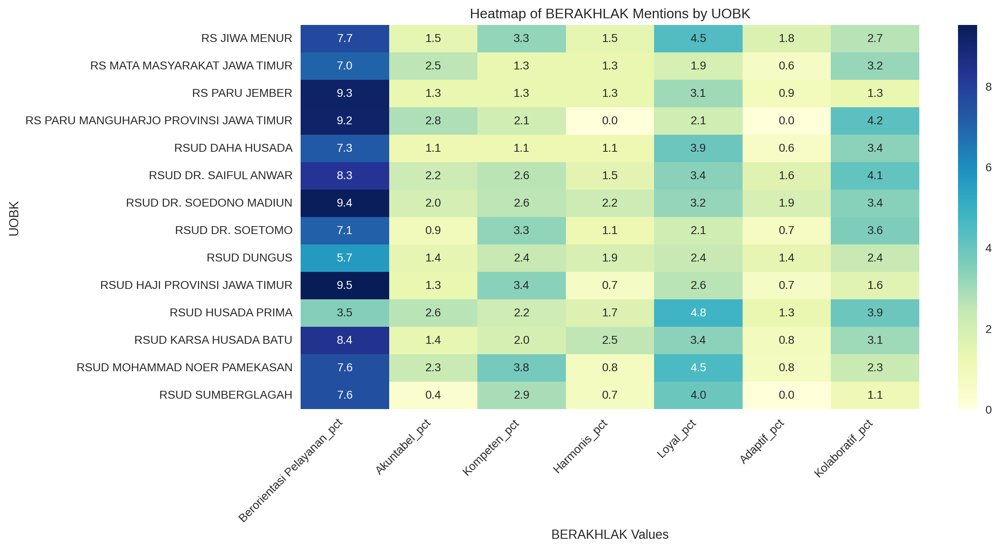

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Function to count BERAKHLAK per UOBK
def count_keywords_by_uobk(df, keywords_dict):
    results = []
    for uobk, group in df.groupby("uobk"):
        row = {"uobk": uobk, "total_feedback": len(group)}
        for value, keywords in keywords_dict.items():
            row[value] = group["Dengan alasan..."].str.contains("|".join(keywords), case=False, na=False).sum()
        results.append(row)
    return pd.DataFrame(results)

# Count per UOBK
uobk_counts = count_keywords_by_uobk(df_uobk, berakhlak_keywords)

# Step 2: Normalize (percentage mentions)
for value in berakhlak_keywords.keys():
    uobk_counts[value + "_pct"] = uobk_counts[value] / uobk_counts["total_feedback"] * 100

# Step 3: Show top UOBK for each value (since only ~14, no need top 10, just show all)
for value in berakhlak_keywords.keys():
    print(f"\nUOBK ranking for {value}:")
    display(uobk_counts[["uobk", value, value + "_pct"]].sort_values(by=value, ascending=False))

# Step 4: Heatmap (percentage values only)
heatmap_df_uobk = uobk_counts.set_index("uobk")[[v+"_pct" for v in berakhlak_keywords.keys()]]
plt.figure(figsize=(12,6))
sns.heatmap(heatmap_df_uobk, cmap="YlGnBu", annot=True, fmt=".1f", cbar=True)
plt.title("Heatmap of BERAKHLAK Mentions by UOBK")
plt.ylabel("UOBK")
plt.xlabel("BERAKHLAK Values")
plt.xticks(rotation=45, ha="right")
plt.show()


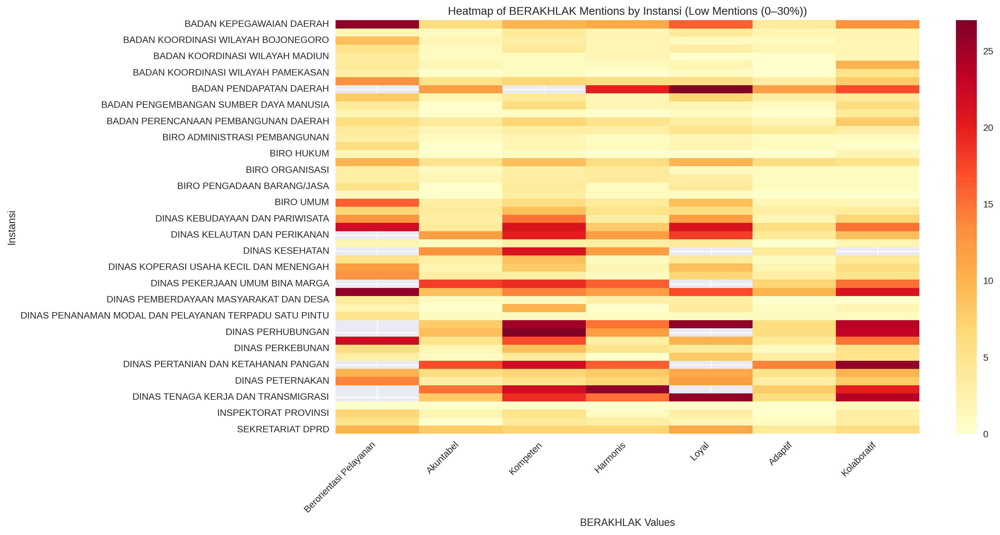

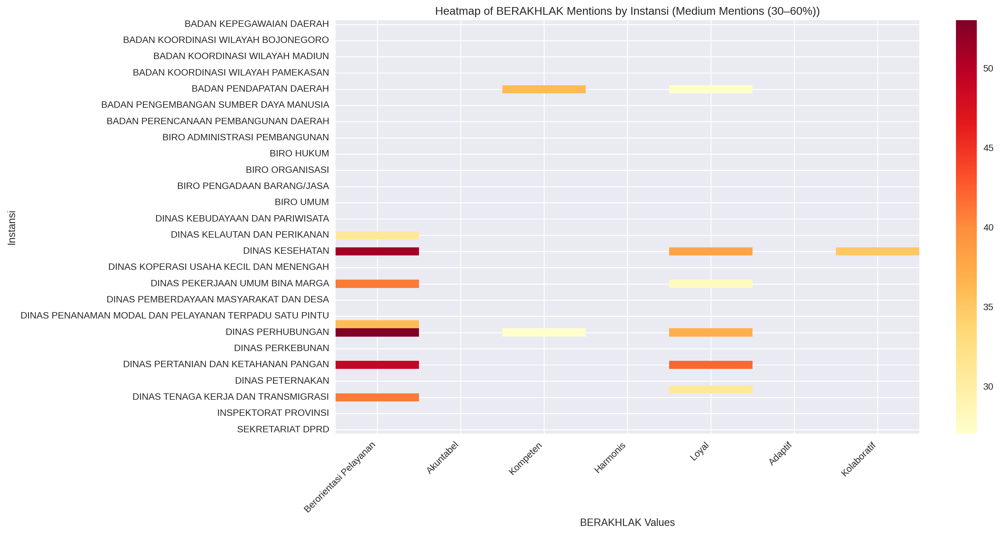

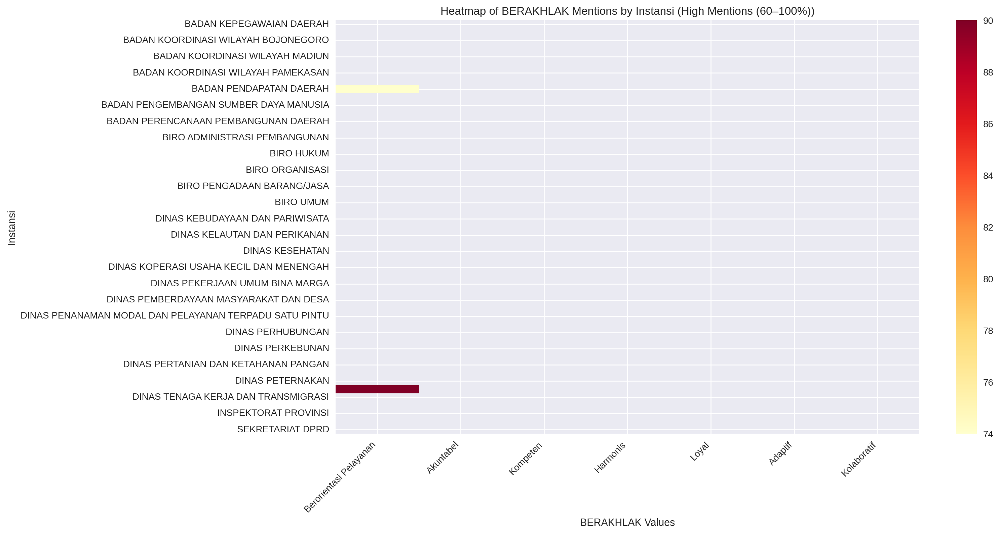

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use mentions (not percentage) for scaling
max_mentions = instansi_counts_pd[[v for v in berakhlak_keywords.keys()]].values.max()

# Define bins for ranges relative to max
ranges = {
    "Low Mentions (0–30%)": (0, 0.3 * max_mentions),
    "Medium Mentions (30–60%)": (0.3 * max_mentions, 0.6 * max_mentions),
    "High Mentions (60–100%)": (0.6 * max_mentions, max_mentions)
}

# Generate 3 heatmaps
for label, (low, high) in ranges.items():
    subset = instansi_counts_pd.set_index("instansi")[[v for v in berakhlak_keywords.keys()]]

    # Mask values outside range (set to NaN so heatmap ignores them)
    subset_masked = subset.where((subset >= low) & (subset <= high))

    plt.figure(figsize=(14, 8))
    sns.heatmap(subset_masked, cmap="YlOrRd", annot=False, cbar=True)
    plt.title(f"Heatmap of BERAKHLAK Mentions by Instansi ({label})")
    plt.ylabel("Instansi")
    plt.xlabel("BERAKHLAK Values")
    plt.xticks(rotation=45, ha="right")
    plt.show()


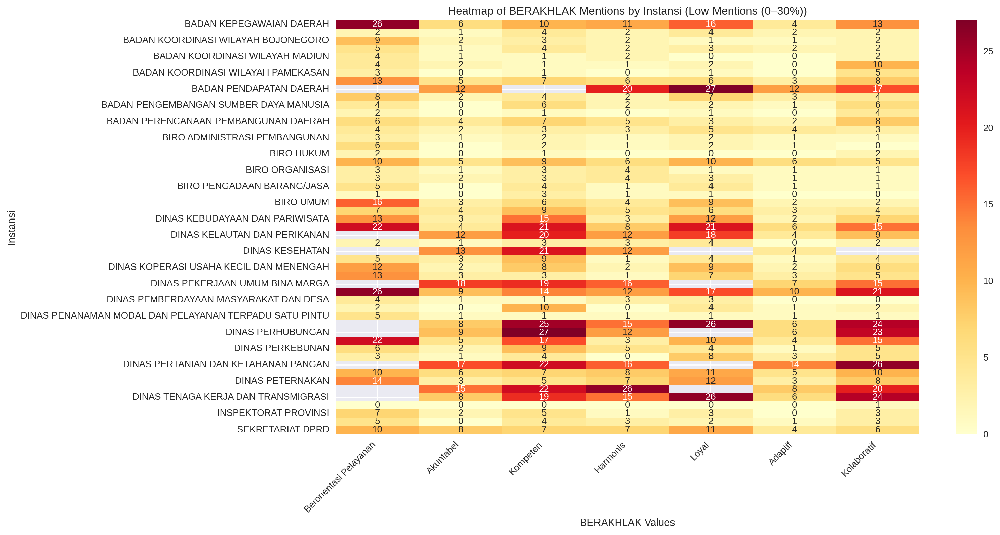

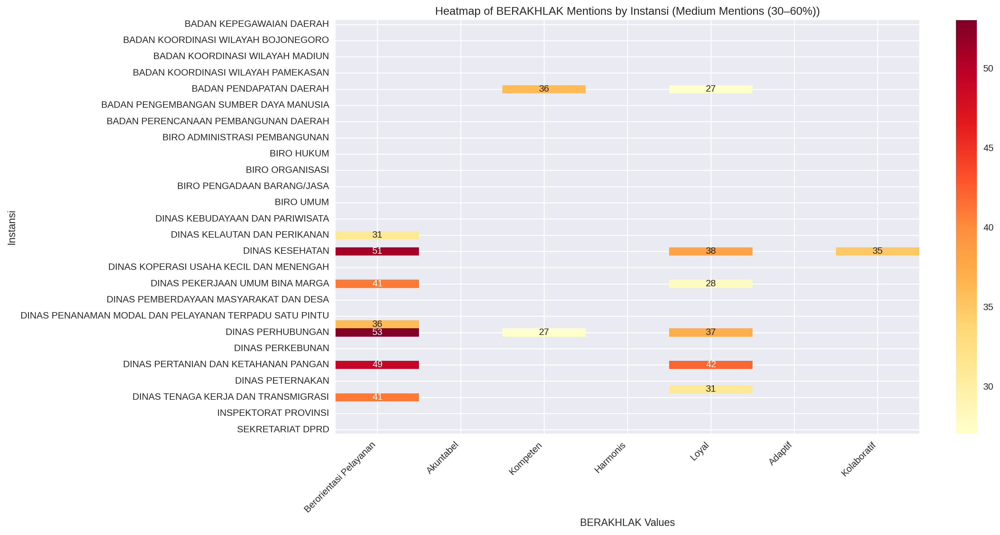

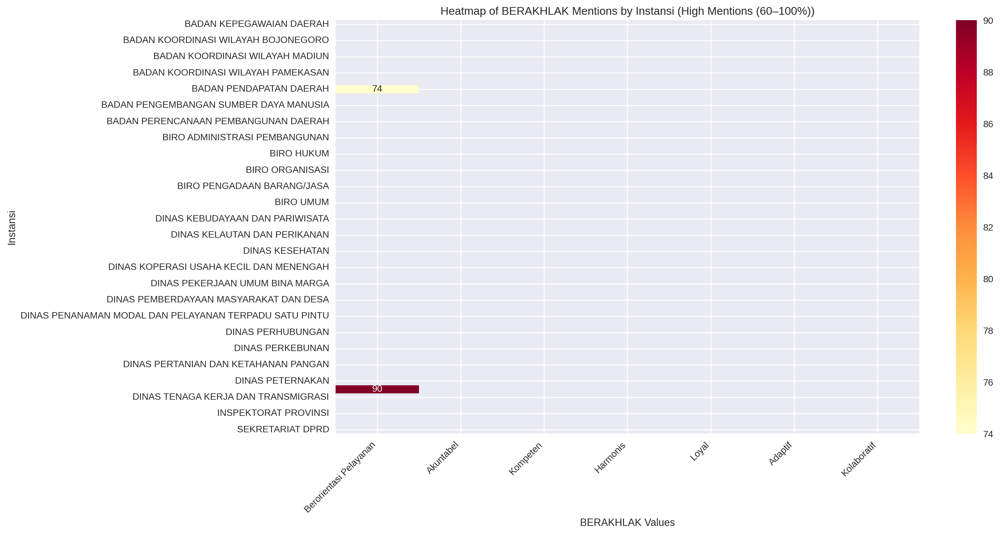

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use mentions (not percentage) for scaling
max_mentions = instansi_counts_pd[[v for v in berakhlak_keywords.keys()]].values.max()

# Define bins for ranges relative to max
ranges = {
    "Low Mentions (0–30%)": (0, 0.3 * max_mentions),
    "Medium Mentions (30–60%)": (0.3 * max_mentions, 0.6 * max_mentions),
    "High Mentions (60–100%)": (0.6 * max_mentions, max_mentions)
}

# Generate 3 heatmaps
for label, (low, high) in ranges.items():
    subset = instansi_counts_pd.set_index("instansi")[[v for v in berakhlak_keywords.keys()]]

    # Mask values outside range (set to NaN so heatmap ignores them)
    subset_masked = subset.where((subset >= low) & (subset <= high))

    plt.figure(figsize=(14, 8))
    sns.heatmap(
        subset_masked,
        cmap="YlOrRd",
        annot=True,           # show numbers
        fmt=".0f",            # integer format (no decimals)
        cbar=True
    )
    plt.title(f"Heatmap of BERAKHLAK Mentions by Instansi ({label})")
    plt.ylabel("Instansi")
    plt.xlabel("BERAKHLAK Values")
    plt.xticks(rotation=45, ha="right")
    plt.show()


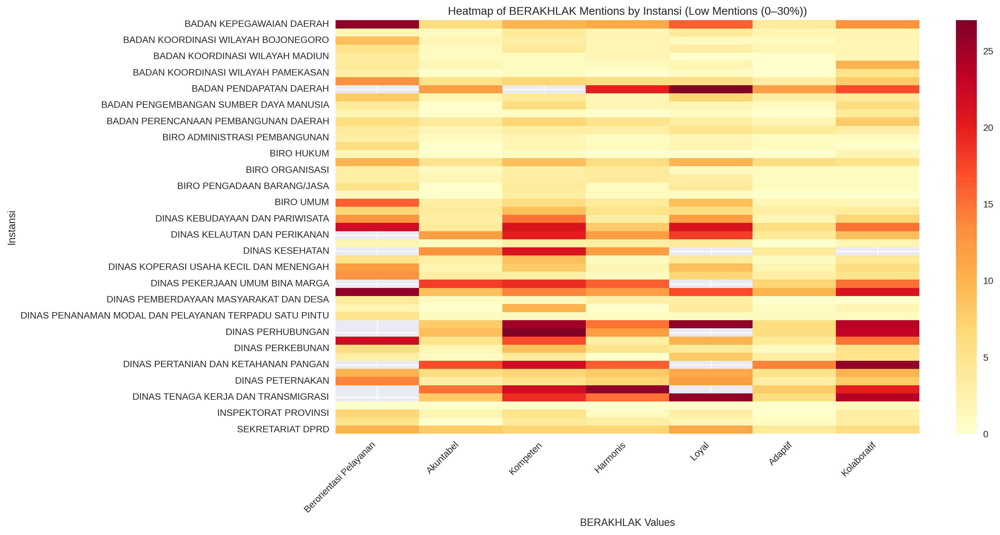

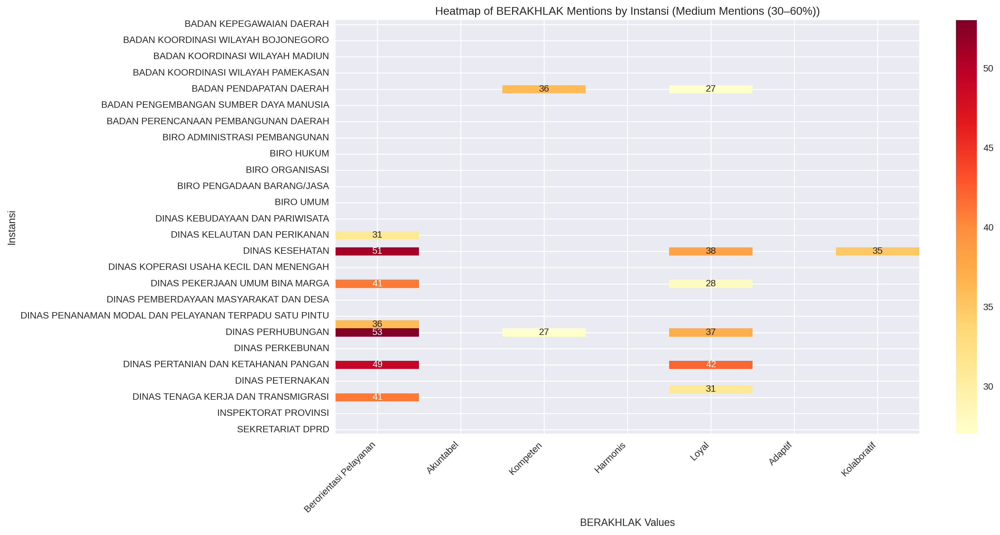

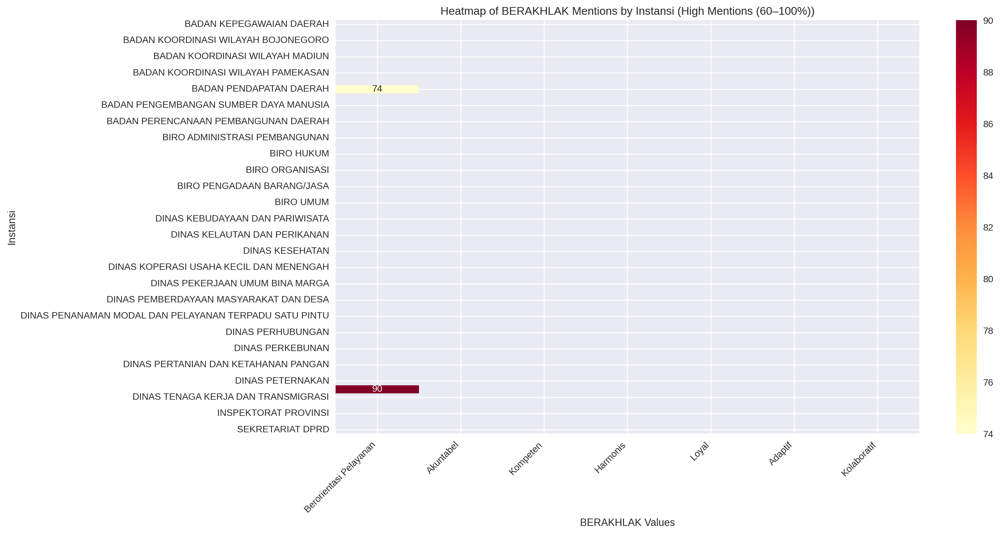

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use mentions (not percentage) for scaling
max_mentions = instansi_counts_pd[[v for v in berakhlak_keywords.keys()]].values.max()

# Define bins for ranges relative to max
ranges = {
    "Low Mentions (0–30%)": (0, 0.3 * max_mentions),
    "Medium Mentions (30–60%)": (0.3 * max_mentions, 0.6 * max_mentions),
    "High Mentions (60–100%)": (0.6 * max_mentions, max_mentions)
}

# Generate 3 heatmaps
for label, (low, high) in ranges.items():
    subset = instansi_counts_pd.set_index("instansi")[[v for v in berakhlak_keywords.keys()]]

    # Mask values outside range (set to NaN so heatmap ignores them)
    subset_masked = subset.where((subset >= low) & (subset <= high))

    plt.figure(figsize=(14, 8))
    sns.heatmap(
        subset_masked,
        cmap="YlOrRd",
        annot=(label != "Low Mentions (0–30%)"),  # no numbers for Low
        fmt=".0f",                                # integer format
        cbar=True
    )
    plt.title(f"Heatmap of BERAKHLAK Mentions by Instansi ({label})")
    plt.ylabel("Instansi")
    plt.xlabel("BERAKHLAK Values")
    plt.xticks(rotation=45, ha="right")
    plt.show()


=== Top 10 Instansi with Highest Mentions of BERAKHLAK ===


,instansi,total_feedback,total_mentions,Berorientasi Pelayanan,Akuntabel,Kompeten,Harmonis,Loyal,Adaptif,Kolaboratif
45,DINAS SOSIAL,693,212,90,15,22,26,31,8,20
8,BADAN PENDAPATAN DAERAH,688,198,74,12,36,20,27,12,17
42,DINAS PERTANIAN DAN KETAHANAN PANGAN,718,186,49,17,22,16,42,14,26
28,DINAS KESEHATAN,767,174,51,13,21,12,38,4,35
38,DINAS PERHUBUNGAN,639,167,53,9,27,12,37,6,23
32,DINAS PEKERJAAN UMUM BINA MARGA,540,144,41,18,19,16,28,7,15
37,DINAS PENDIDIKAN INDUK,373,140,36,8,25,15,26,6,24
46,DINAS TENAGA KERJA DAN TRANSMIGRASI,596,139,41,8,19,15,26,6,24
33,DINAS PEKERJAAN UMUM SUMBER DAYA AIR,351,109,26,9,14,12,17,10,21
26,DINAS KELAUTAN DAN PERIKANAN,447,106,31,12,20,12,18,4,9



=== Bottom 10 Instansi with Lowest Mentions of BERAKHLAK ===


,instansi,total_feedback,total_mentions,Berorientasi Pelayanan,Akuntabel,Kompeten,Harmonis,Loyal,Adaptif,Kolaboratif
47,Dinas PU SDA,1,1,0,0,0,0,0,0,1
16,BIRO HUKUM,43,5,2,0,1,0,0,0,2
21,BIRO PEREKONOMIAN,47,6,1,0,3,1,1,0,0
11,BADAN PENGHUBUNG DAERAH PROVINSI,47,8,2,0,1,0,1,0,4
4,BADAN KOORDINASI WILAYAH MADIUN,54,10,4,1,1,2,0,0,2
6,BADAN KOORDINASI WILAYAH PAMEKASAN,39,10,3,0,1,0,1,0,5
36,DINAS PENANAMAN MODAL DAN PELAYANAN TERPADU SATU PINTU,64,11,5,1,1,1,1,1,1
14,BIRO ADMINISTRASI PEMBANGUNAN,40,11,3,1,2,1,2,1,1
15,BIRO ADMINISTRASI PIMPINAN,60,12,6,0,2,1,2,1,0
34,DINAS PEMBERDAYAAN MASYARAKAT DAN DESA,86,12,4,1,1,3,3,0,0


/tmp/ipython-input-255641176.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top10_instansi, x="total_mentions", y="instansi", ax=axes[0], palette="Greens_r")
/tmp/ipython-input-255641176.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bottom10_instansi, x="total_mentions", y="instansi", ax=axes[1], palette="Reds")


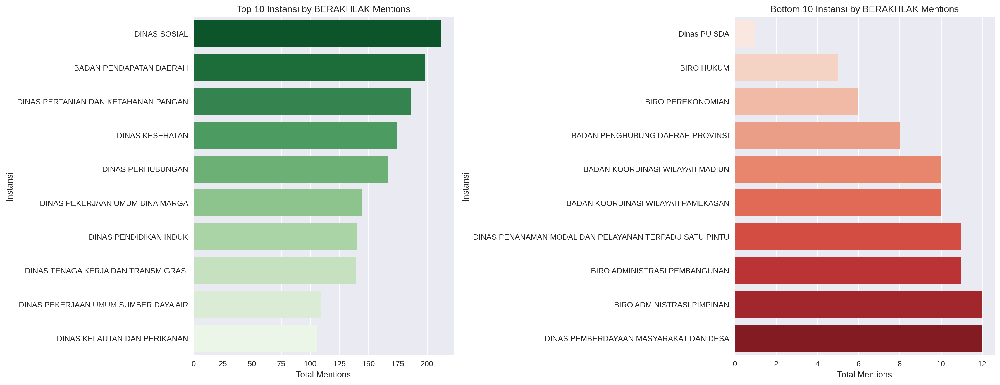

In [68]:
# ================================
# Analysis: Top 10 & Bottom 10 Instansi by Mentions
# ================================

# Add a column for total mentions across all BERAKHLAK values
instansi_counts_pd["total_mentions"] = instansi_counts_pd[list(berakhlak_keywords.keys())].sum(axis=1)

# Sort descending for top 10
top10_instansi = instansi_counts_pd.sort_values(by="total_mentions", ascending=False).head(10)

# Sort ascending for bottom 10
bottom10_instansi = instansi_counts_pd.sort_values(by="total_mentions", ascending=True).head(10)

print("=== Top 10 Instansi with Highest Mentions of BERAKHLAK ===")
display(top10_instansi[["instansi", "total_feedback", "total_mentions"] + list(berakhlak_keywords.keys())])

print("\n=== Bottom 10 Instansi with Lowest Mentions of BERAKHLAK ===")
display(bottom10_instansi[["instansi", "total_feedback", "total_mentions"] + list(berakhlak_keywords.keys())])

# Visualization: Barplots
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Top 10 barplot
sns.barplot(data=top10_instansi, x="total_mentions", y="instansi", ax=axes[0], palette="Greens_r")
axes[0].set_title("Top 10 Instansi by BERAKHLAK Mentions")
axes[0].set_xlabel("Total Mentions")
axes[0].set_ylabel("Instansi")

# Bottom 10 barplot
sns.barplot(data=bottom10_instansi, x="total_mentions", y="instansi", ax=axes[1], palette="Reds")
axes[1].set_title("Bottom 10 Instansi by BERAKHLAK Mentions")
axes[1].set_xlabel("Total Mentions")
axes[1].set_ylabel("Instansi")

plt.tight_layout()
plt.show()


/tmp/ipython-input-1753738679.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_perangkat_daerah["sentiment"] = df_perangkat_daerah["Dengan alasan..."].astype(str).apply(lambda x: TextBlob(x).sentiment.polarity)
/tmp/ipython-input-1753738679.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_perangkat_daerah["sentiment_label"] = pd.cut(df_perangkat_daerah["sentiment"],


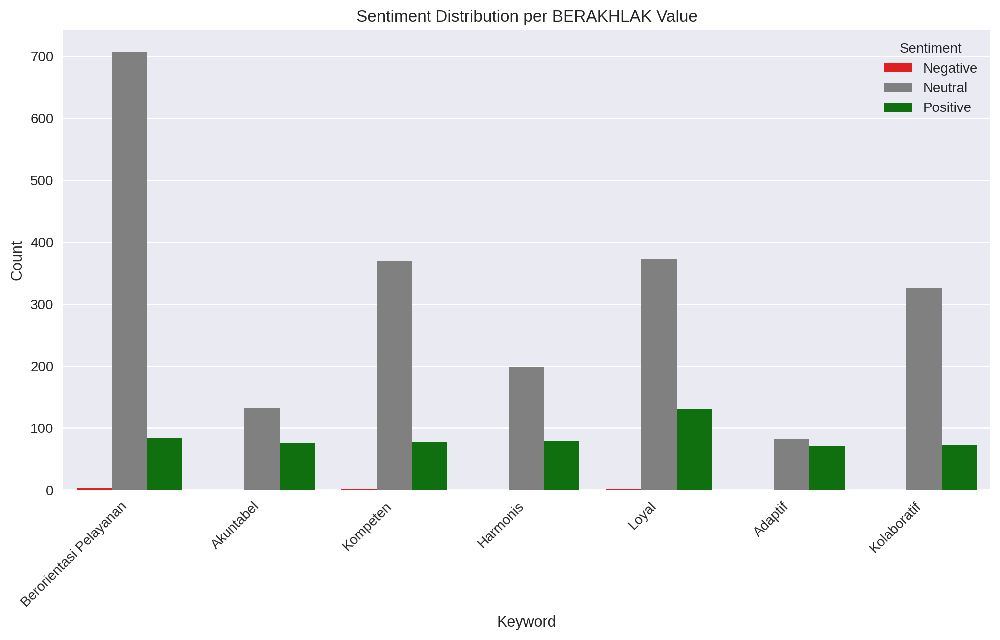

In [69]:
# Reuse sentiment scores (TextBlob polarity)
df_perangkat_daerah["sentiment"] = df_perangkat_daerah["Dengan alasan..."].astype(str).apply(lambda x: TextBlob(x).sentiment.polarity)
df_perangkat_daerah["sentiment_label"] = pd.cut(df_perangkat_daerah["sentiment"],
                                                bins=[-1, -0.05, 0.05, 1],
                                                labels=["Negative", "Neutral", "Positive"])

# Count BERAKHLAK keywords by sentiment
sentiment_keyword_counts = []
for value, keywords in berakhlak_keywords.items():
    for label in ["Negative", "Neutral", "Positive"]:
        count = df_perangkat_daerah[
            (df_perangkat_daerah["Dengan alasan..."].str.contains("|".join(keywords), case=False, na=False)) &
            (df_perangkat_daerah["sentiment_label"] == label)
        ].shape[0]
        sentiment_keyword_counts.append({"Keyword": value, "Sentiment": label, "Count": count})

sent_kw_df = pd.DataFrame(sentiment_keyword_counts)

# Plot
plt.figure(figsize=(12,6))
sns.barplot(data=sent_kw_df, x="Keyword", y="Count", hue="Sentiment", palette={"Negative":"red","Neutral":"gray","Positive":"green"})
plt.title("Sentiment Distribution per BERAKHLAK Value")
plt.xticks(rotation=45, ha="right")
plt.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-1326011977.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bigram_df, x="Count", y="Bigram", palette="Blues_r")


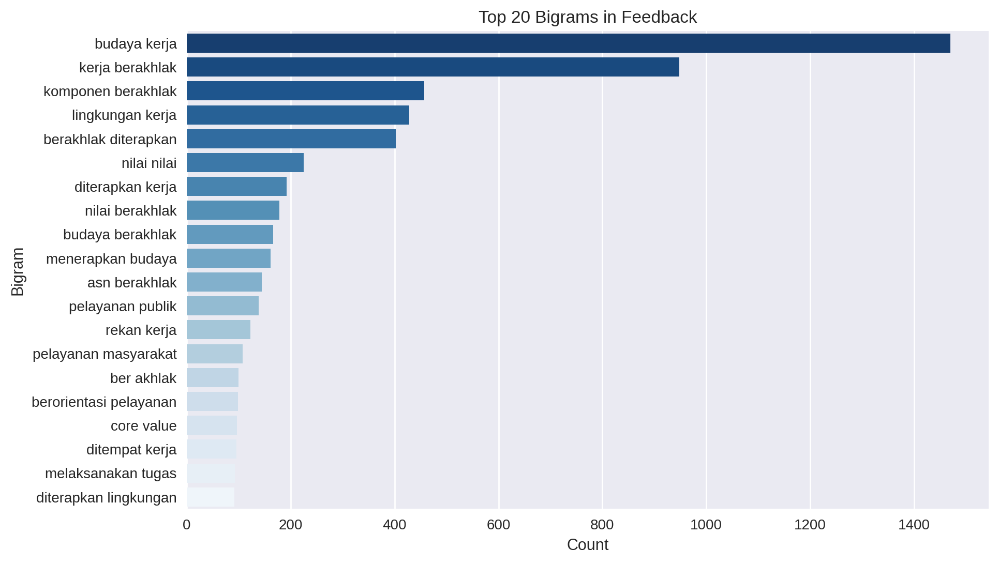

/tmp/ipython-input-1326011977.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=trigram_df, x="Count", y="Trigram", palette="Purples_r")


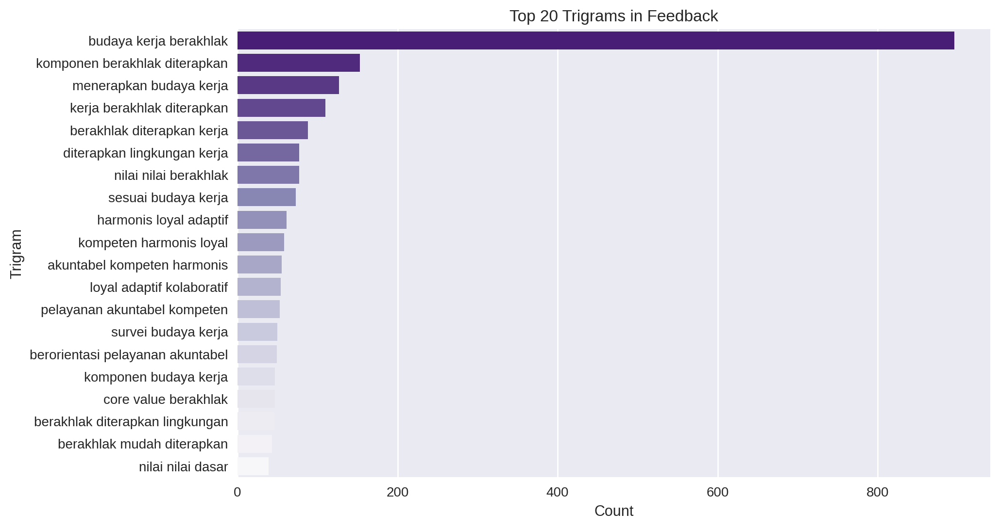

In [75]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
import nltk

# Download Indonesian stopwords (first time only)
nltk.download("stopwords")

# Use NLTK Indonesian stopwords
indo_stopwords = stopwords.words("indonesian")

# Bigram
vectorizer_bigram = CountVectorizer(ngram_range=(2,2), stop_words=indo_stopwords)
X_bigram = vectorizer_bigram.fit_transform(texts)
bigram_counts = X_bigram.sum(axis=0).A1
bigram_freq = [(word, bigram_counts[idx]) for word, idx in vectorizer_bigram.vocabulary_.items()]
bigram_df = pd.DataFrame(bigram_freq, columns=["Bigram", "Count"]).sort_values(by="Count", ascending=False).head(20)

# Trigram
vectorizer_trigram = CountVectorizer(ngram_range=(3,3), stop_words=indo_stopwords)
X_trigram = vectorizer_trigram.fit_transform(texts)
trigram_counts = X_trigram.sum(axis=0).A1
trigram_freq = [(word, trigram_counts[idx]) for word, idx in vectorizer_trigram.vocabulary_.items()]
trigram_df = pd.DataFrame(trigram_freq, columns=["Trigram", "Count"]).sort_values(by="Count", ascending=False).head(20)

# Plot
plt.figure(figsize=(10,6))
sns.barplot(data=bigram_df, x="Count", y="Bigram", palette="Blues_r")
plt.title("Top 20 Bigrams in Feedback")
plt.show()

plt.figure(figsize=(10,6))
sns.barplot(data=trigram_df, x="Count", y="Trigram", palette="Purples_r")
plt.title("Top 20 Trigrams in Feedback")
plt.show()


In [74]:
vectorizer_bigram = CountVectorizer(ngram_range=(2,2), stop_words=None)
vectorizer_trigram = CountVectorizer(ngram_range=(3,3), stop_words=None)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


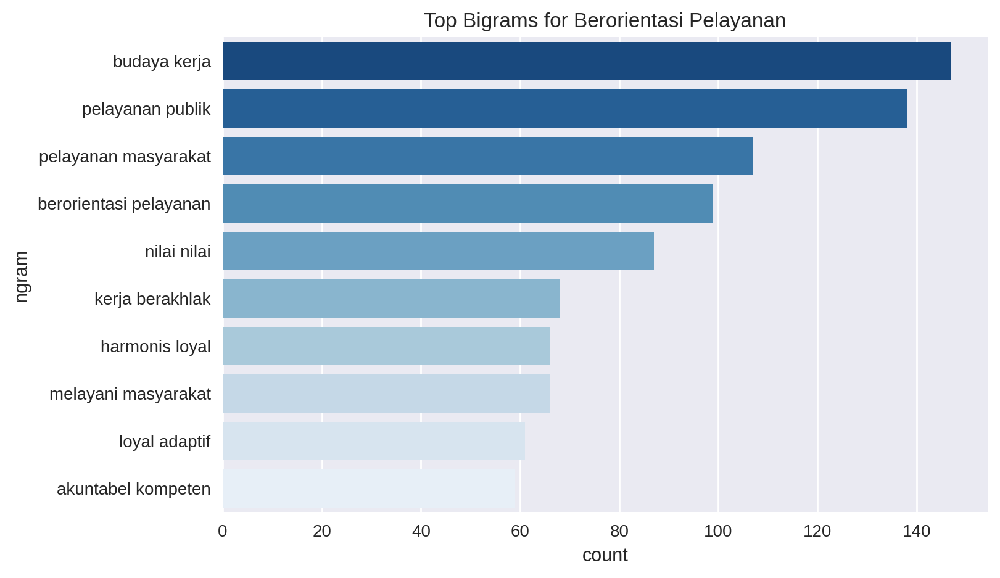

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


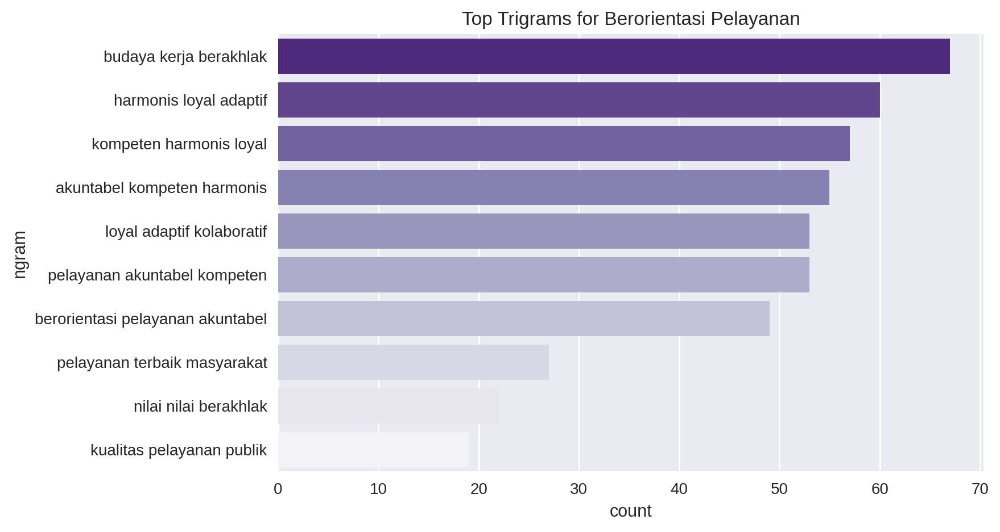

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


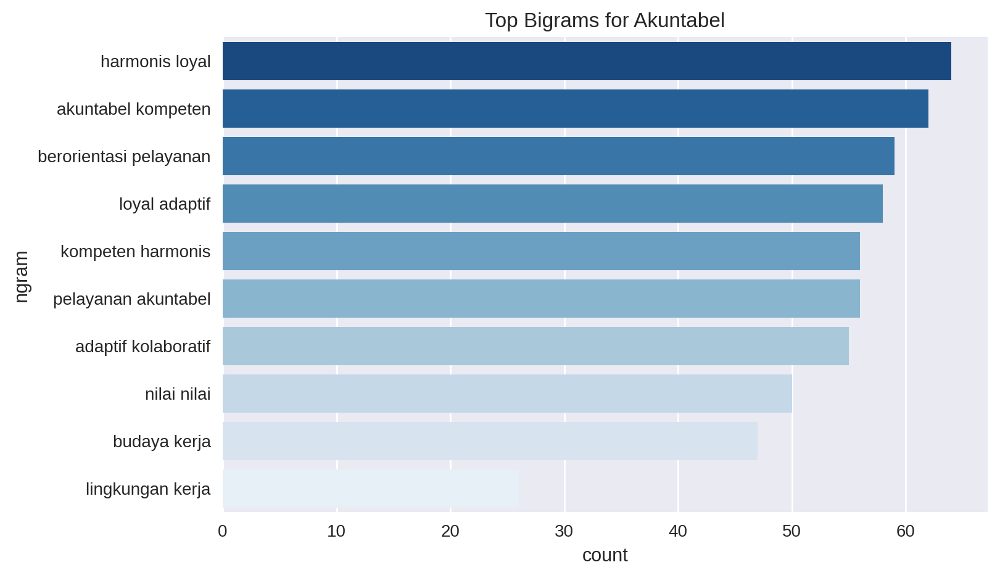

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


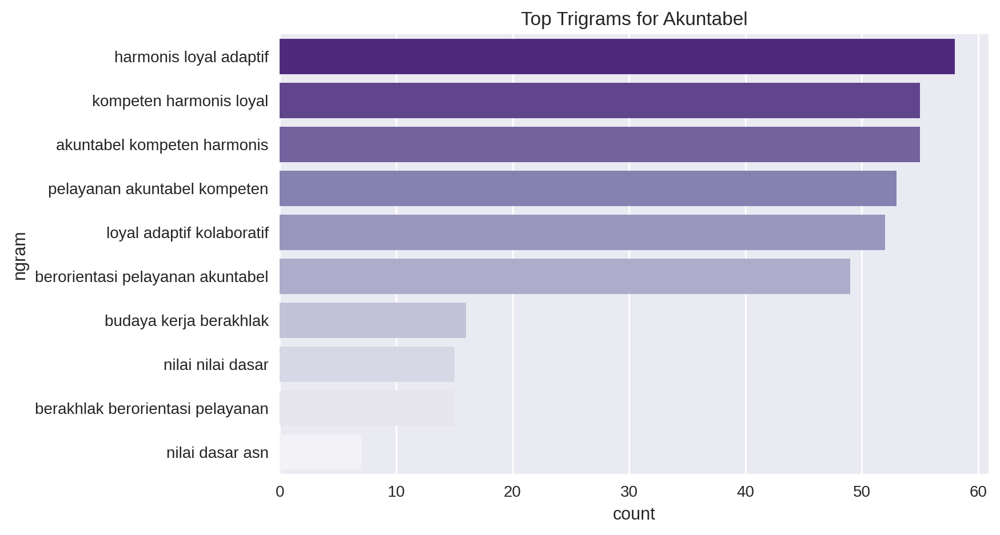

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


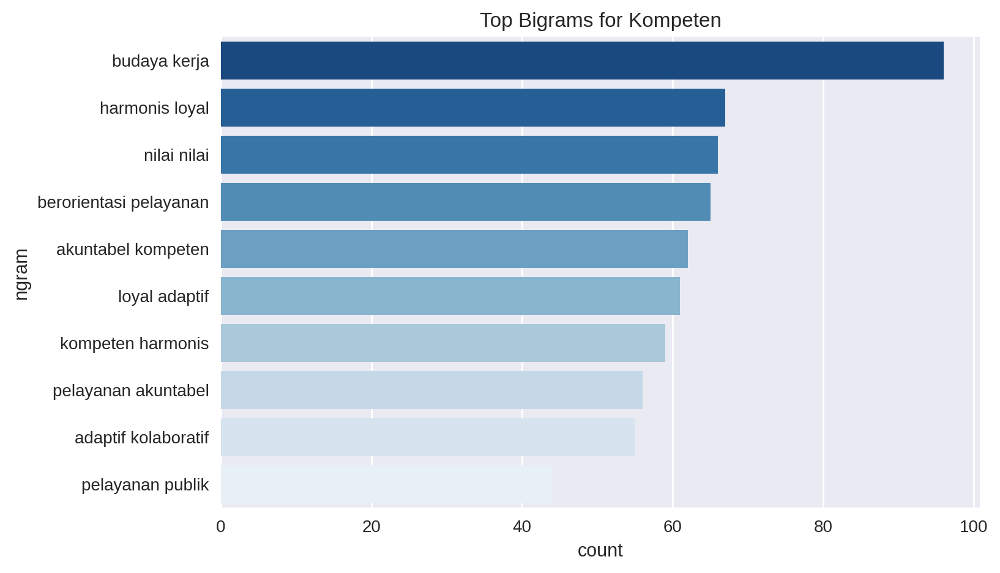

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


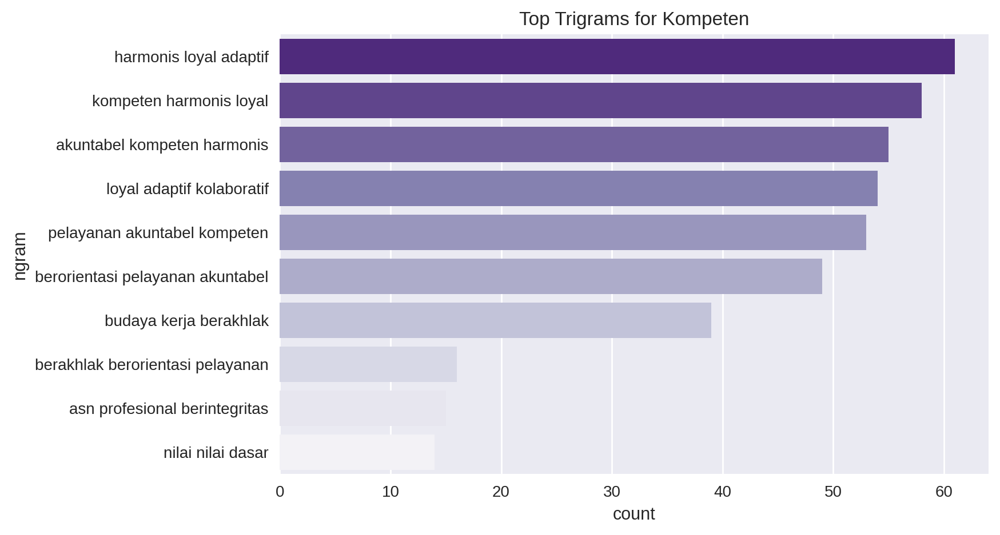

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


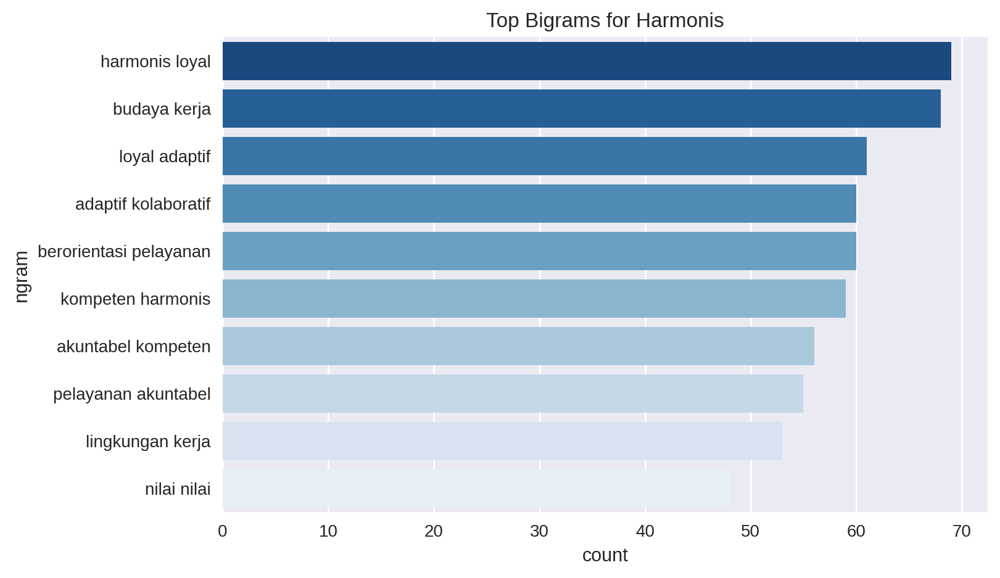

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


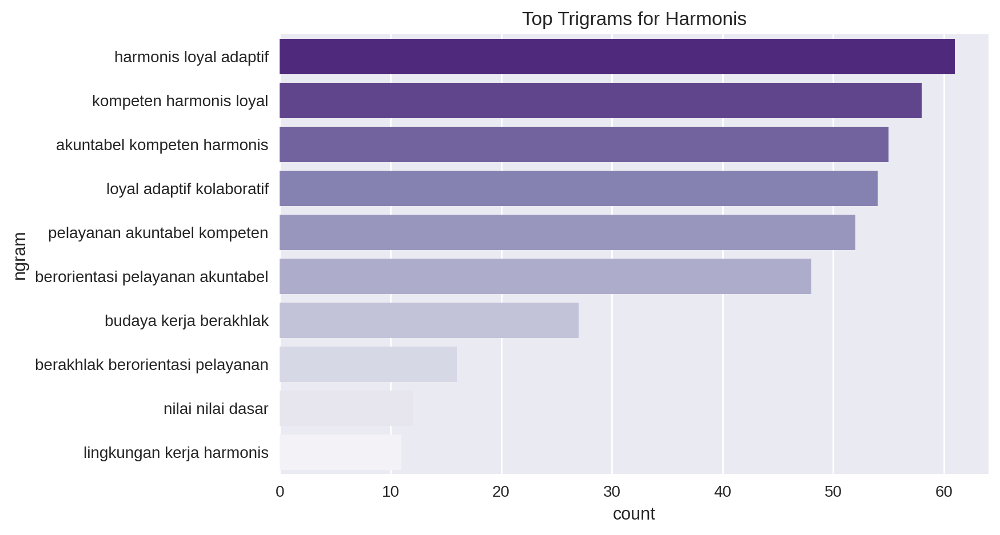

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


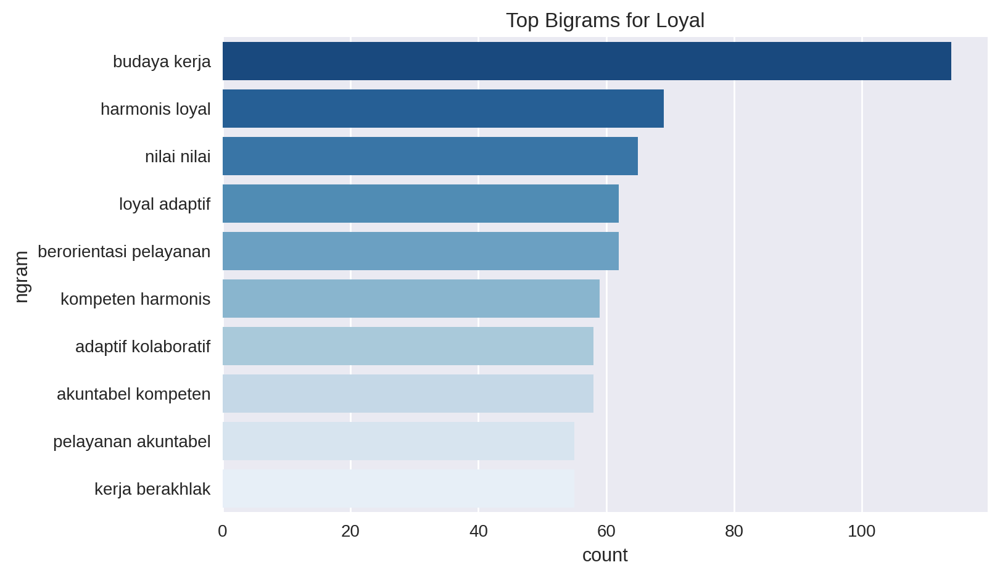

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


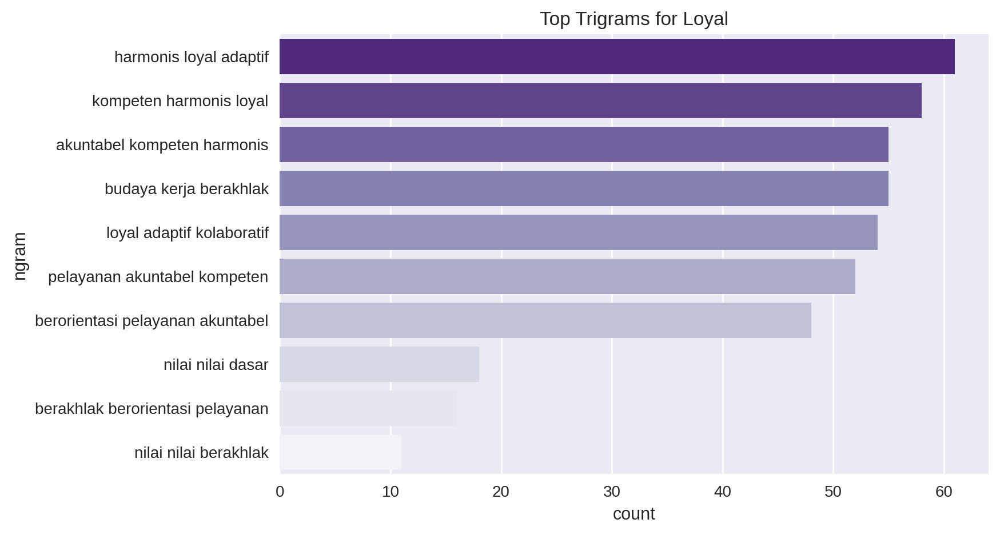

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


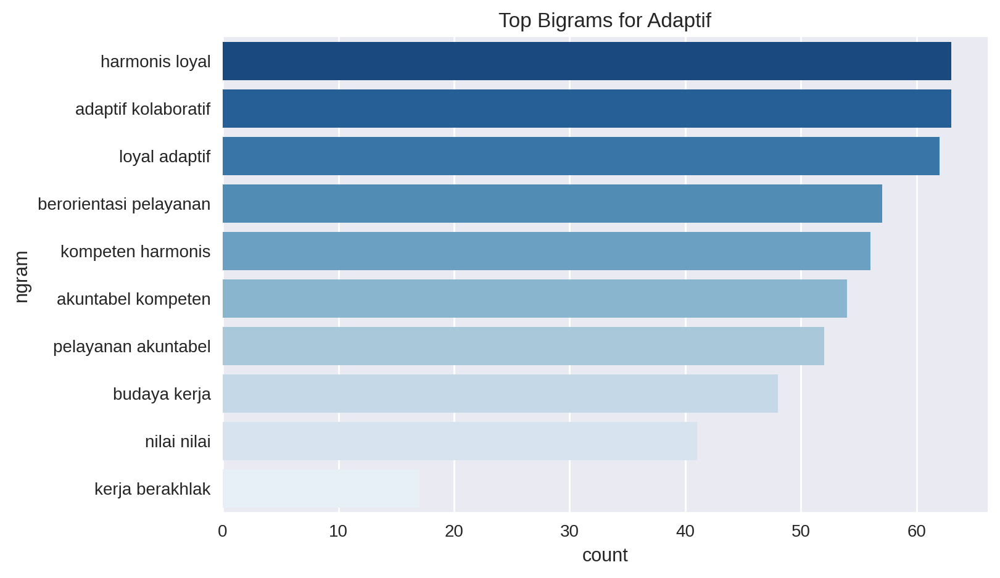

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


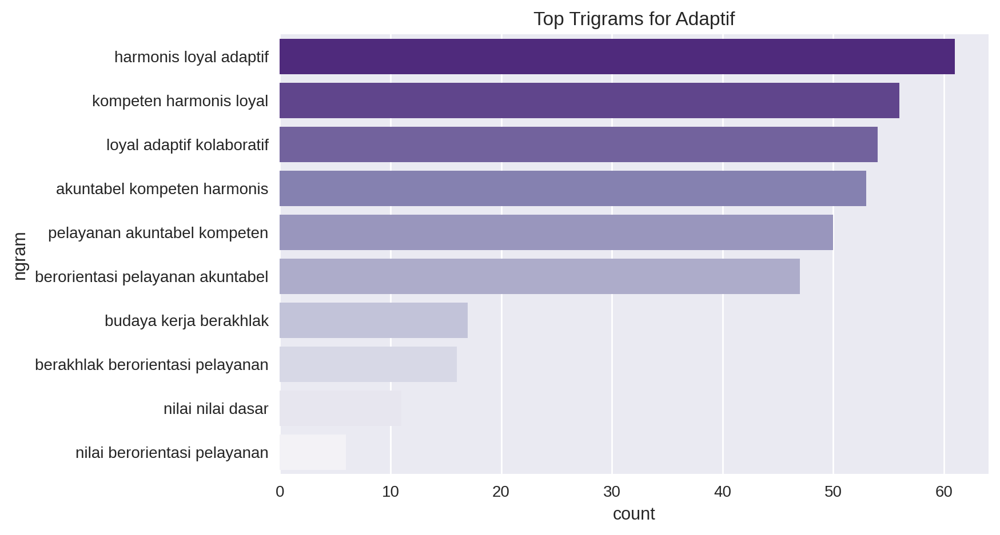

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kali', 'kurangnya', 'mata', 'olah', 'sekurang', 'setidak', 'tama', 'tidaknya'] not in stop_words.
  warnings.warn(
/tmp/ipython-input-3234994070.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")


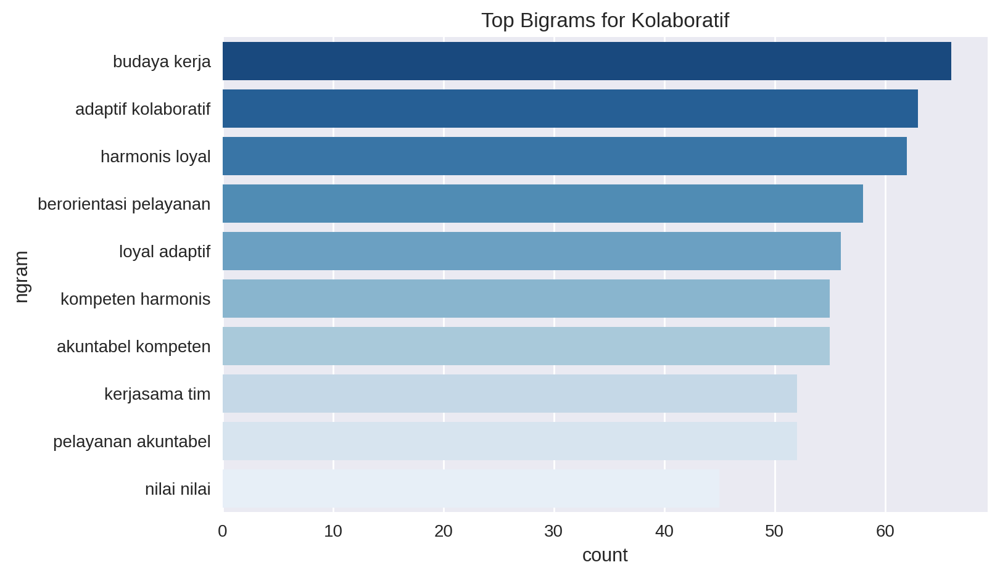

/tmp/ipython-input-3234994070.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")


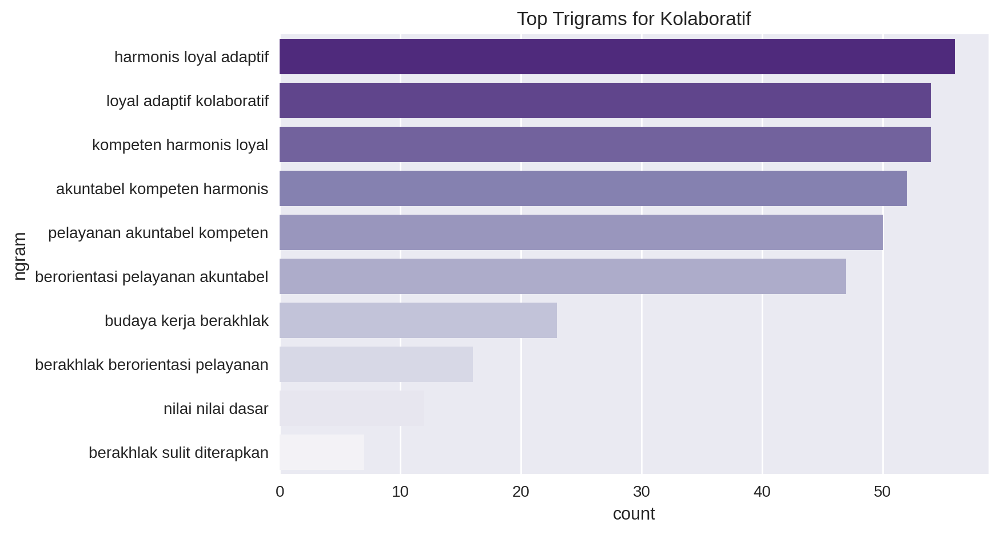

In [76]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
import nltk

# Make sure NLTK stopwords are available
nltk.download("stopwords")
indo_stopwords = stopwords.words("indonesian")

def top_ngrams(texts, ngram_range=(2,2), top_n=10):
    """Extract top n-grams from given text series"""
    vec = CountVectorizer(ngram_range=ngram_range, stop_words=indo_stopwords).fit(texts)
    X = vec.transform(texts)
    counts = X.sum(axis=0).A1
    freq = [(word, counts[idx]) for word, idx in vec.vocabulary_.items()]
    return pd.DataFrame(freq, columns=["ngram", "count"]).sort_values(by="count", ascending=False).head(top_n)

# Loop through each BERAKHLAK value
bi_results = {}
tri_results = {}

for value, keywords in berakhlak_keywords.items():
    mask = df_perangkat_daerah["Dengan alasan..."].str.contains("|".join(keywords), case=False, na=False)
    subset = df_perangkat_daerah.loc[mask, "Dengan alasan..."].dropna().astype(str).str.lower()

    if len(subset) > 0:
        bi_results[value] = top_ngrams(subset, ngram_range=(2,2), top_n=10)
        tri_results[value] = top_ngrams(subset, ngram_range=(3,3), top_n=10)

        # Plot Bigram
        plt.figure(figsize=(8,5))
        sns.barplot(data=bi_results[value], x="count", y="ngram", palette="Blues_r")
        plt.title(f"Top Bigrams for {value}")
        plt.show()

        # Plot Trigram
        plt.figure(figsize=(8,5))
        sns.barplot(data=tri_results[value], x="count", y="ngram", palette="Purples_r")
        plt.title(f"Top Trigrams for {value}")
        plt.show()
